# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

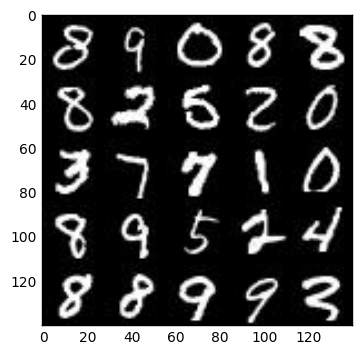

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

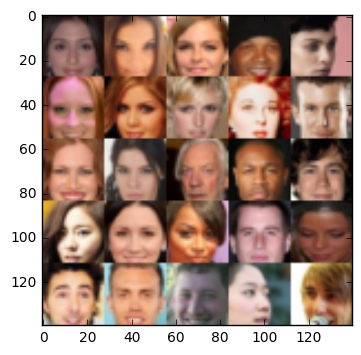

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """

    real_inputs_placeholder = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real') 
    z_inputs_placeholder = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate_placeholder = tf.placeholder(tf.float32, shape=None)
    
    return real_inputs_placeholder, z_inputs_placeholder, learning_rate_placeholder
    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [6]:
def discriminator(images, reuse=False, alpha=0.2, keep_prob=0.5):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # Standard deviation used to initialize convolution layers' kernerls.
    standard_deviation = 0.02
    
    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = tf.layers.conv2d(images, 
                              64, 
                              5, 
                              strides=2, 
                              padding='same', 
                              kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        relu1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d(relu1, 
                              128, 
                              5, 
                              strides=2, 
                              padding='same',
                             kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        
        x3 = tf.layers.conv2d(relu2, 
                              256,
                              5,
                              strides=2, 
                              padding='same',
                             kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        
        x4 = tf.layers.conv2d(relu3, 
                              512, 
                              5, 
                              strides=2, 
                              padding='same',
                             kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        bn4 = tf.layers.batch_normalization(x4, training=True)
        relu4 = tf.maximum(alpha * bn4, bn4)

        # Flatten it
        flat = tf.reshape(relu4, (-1, 2 * 2 * 512))
        logits = tf.layers.dense(flat, 1, kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        
        # Add dropout
        logits = tf.nn.dropout(logits, keep_prob)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2, keep_prob=0.5):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # Standard deviation used to initialize convolution layers' kernerls.
    
    standard_deviation = 0.02
    with tf.variable_scope('generator', reuse=(not is_train)):
        # First fully connected layer
        x1 = tf.layers.dense(z, 2*2*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now

        x2 = tf.layers.conv2d_transpose(x1,
                                        128,
                                        5, 
                                        strides=2, 
                                        padding='valid',
                                       kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        x3 = tf.layers.conv2d_transpose(x2,
                                        64,
                                        5, 
                                        strides=2,
                                        padding='same',
                                       kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3,
                                            out_channel_dim,
                                            5, 
                                            strides=2, 
                                            padding='same',
                                           kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        # 28x28x3 now
        # logits = tf.nn.dropout(logits, keep_prob)
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
import numpy as np 

def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_model_real_labels = tf.ones_like(d_model_real) * np.random.uniform(0.7,1.2)
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=d_model_real_labels))
    
    d_model_fake_labels = tf.zeros_like(d_model_fake)
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=d_model_fake_labels))
    
    g_model_labels = tf.ones_like(d_model_fake) * np.random.uniform(0.7,1.2)
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=g_model_labels))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get the trainable_variables, split into G and D parts
    trainable_variables = tf.trainable_variables()
    generator_variables = [variable for variable in trainable_variables if variable.name.startswith('generator')]
    discriminator_variables = [variable for variable in trainable_variables if variable.name.startswith('discriminator')]

    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        discriminator_train_optimizer = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=discriminator_variables)
        generator_train_optimizer = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=generator_variables)
    
        return discriminator_train_optimizer, generator_train_optimizer


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    
    # First, let's build the model
    print("Shape: ", data_shape)
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    sample_z = np.random.uniform(-1, 1, size=(50, z_dim))
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    samples = []
    losses = []
    
    # training
    with tf.Session() as sess:        
        sess.run(tf.global_variables_initializer())
        for e in range(epoch_count):
            batch_number = 0
            for batch_images in get_batches(batch_size):
                batch_number += 1
 
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))            
                
                
                sess.run(d_train_opt, feed_dict={input_real: batch_images, 
                                                 input_z: batch_z,
                                                 lr: learning_rate})
                
                # Train generator three times per batch
                sess.run(g_train_opt, feed_dict={input_real: batch_images, 
                                                 input_z: 
                                                 batch_z,
                                                 lr: learning_rate})
                sess.run(g_train_opt, feed_dict={input_real: batch_images, 
                                                 input_z: batch_z,
                                                 lr: learning_rate})
                sess.run(g_train_opt, feed_dict={input_real: batch_images,
                                                 input_z: batch_z,
                                                 lr: learning_rate})
                
                
                # show output every 100 batches
                if batch_number % 100 == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)

                # print loss every epoch 
                train_loss_d = sess.run(d_loss, {input_z: batch_z,
                                                 input_real: batch_images})
                train_loss_g = g_loss.eval({input_z: batch_z})
                
                if batch_number % 10 == 0:
                    print("Epoch {}/{}...".format(e + 1, epoch_count),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))    
                    # save loss
                    losses.append((train_loss_d, train_loss_g))

                    # sample from generator 
                    gen_samples = sess.run(
                                   generator(input_z, data_shape[3], is_train=False),
                                   feed_dict={input_real: batch_images, input_z: sample_z, lr: learning_rate})
                    samples.append(gen_samples)
        show_generator_output(sess, 9, input_z, data_shape[3], data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Shape:  (60000, 28, 28, 1)
Epoch 1/2... Discriminator Loss: 2.4624... Generator Loss: 0.4238
Epoch 1/2... Discriminator Loss: 1.3043... Generator Loss: 1.1140
Epoch 1/2... Discriminator Loss: 1.2197... Generator Loss: 1.8181
Epoch 1/2... Discriminator Loss: 1.3486... Generator Loss: 0.6316
Epoch 1/2... Discriminator Loss: 1.2864... Generator Loss: 1.0092
Epoch 1/2... Discriminator Loss: 1.5555... Generator Loss: 1.2736
Epoch 1/2... Discriminator Loss: 1.3412... Generator Loss: 0.7088
Epoch 1/2... Discriminator Loss: 1.3424... Generator Loss: 0.6283
Epoch 1/2... Discriminator Loss: 1.2760... Generator Loss: 1.3657


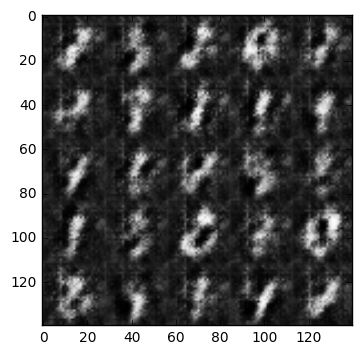

Epoch 1/2... Discriminator Loss: 1.3058... Generator Loss: 1.2978
Epoch 1/2... Discriminator Loss: 1.3540... Generator Loss: 1.2513
Epoch 1/2... Discriminator Loss: 1.3576... Generator Loss: 1.0594
Epoch 1/2... Discriminator Loss: 1.4737... Generator Loss: 0.7344
Epoch 1/2... Discriminator Loss: 1.3187... Generator Loss: 0.9795
Epoch 1/2... Discriminator Loss: 1.8775... Generator Loss: 0.3422
Epoch 1/2... Discriminator Loss: 1.2718... Generator Loss: 0.8075
Epoch 1/2... Discriminator Loss: 1.2825... Generator Loss: 0.8276
Epoch 1/2... Discriminator Loss: 1.3288... Generator Loss: 0.8193
Epoch 1/2... Discriminator Loss: 1.3608... Generator Loss: 0.5914


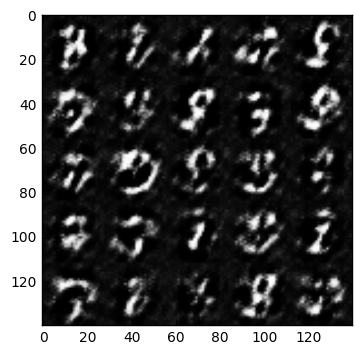

Epoch 1/2... Discriminator Loss: 1.2834... Generator Loss: 0.9075
Epoch 1/2... Discriminator Loss: 1.2805... Generator Loss: 0.7139
Epoch 1/2... Discriminator Loss: 1.3462... Generator Loss: 0.6227
Epoch 1/2... Discriminator Loss: 1.5014... Generator Loss: 1.1263
Epoch 1/2... Discriminator Loss: 1.2471... Generator Loss: 0.4960
Epoch 1/2... Discriminator Loss: 1.2941... Generator Loss: 0.7493
Epoch 1/2... Discriminator Loss: 1.4627... Generator Loss: 0.7850
Epoch 1/2... Discriminator Loss: 1.2354... Generator Loss: 0.7818
Epoch 1/2... Discriminator Loss: 1.3846... Generator Loss: 0.6522
Epoch 1/2... Discriminator Loss: 1.5413... Generator Loss: 1.4274


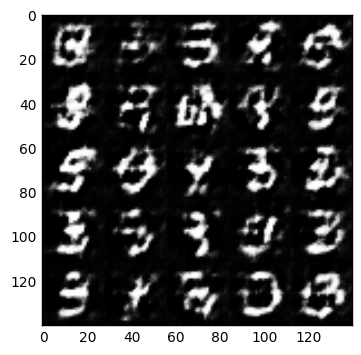

Epoch 1/2... Discriminator Loss: 1.3094... Generator Loss: 0.6324
Epoch 1/2... Discriminator Loss: 1.3590... Generator Loss: 0.8942
Epoch 1/2... Discriminator Loss: 1.4585... Generator Loss: 0.6063
Epoch 1/2... Discriminator Loss: 1.4861... Generator Loss: 0.4743
Epoch 1/2... Discriminator Loss: 1.2210... Generator Loss: 0.7963
Epoch 1/2... Discriminator Loss: 1.3537... Generator Loss: 0.6713
Epoch 1/2... Discriminator Loss: 1.4878... Generator Loss: 0.4614
Epoch 1/2... Discriminator Loss: 1.3937... Generator Loss: 0.5502
Epoch 1/2... Discriminator Loss: 1.7111... Generator Loss: 0.4717
Epoch 1/2... Discriminator Loss: 1.4887... Generator Loss: 0.5224


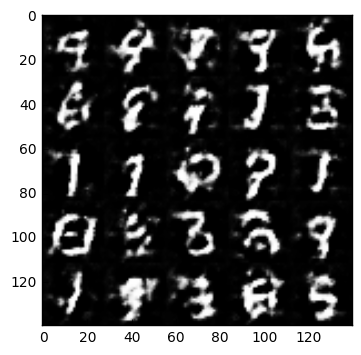

Epoch 1/2... Discriminator Loss: 1.4264... Generator Loss: 0.6369
Epoch 1/2... Discriminator Loss: 1.2257... Generator Loss: 0.9185
Epoch 1/2... Discriminator Loss: 1.3409... Generator Loss: 0.6055
Epoch 1/2... Discriminator Loss: 1.1568... Generator Loss: 0.8709
Epoch 1/2... Discriminator Loss: 1.4378... Generator Loss: 0.5479
Epoch 1/2... Discriminator Loss: 1.5595... Generator Loss: 0.5746
Epoch 1/2... Discriminator Loss: 1.3805... Generator Loss: 0.4783
Epoch 1/2... Discriminator Loss: 1.4979... Generator Loss: 1.0084
Epoch 1/2... Discriminator Loss: 1.3801... Generator Loss: 0.8328
Epoch 1/2... Discriminator Loss: 1.4705... Generator Loss: 0.4631


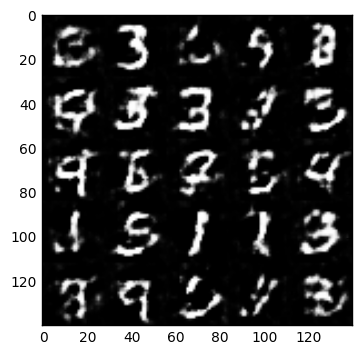

Epoch 1/2... Discriminator Loss: 1.4467... Generator Loss: 0.4835
Epoch 1/2... Discriminator Loss: 1.6489... Generator Loss: 0.8573
Epoch 1/2... Discriminator Loss: 1.7484... Generator Loss: 0.3981
Epoch 1/2... Discriminator Loss: 1.4504... Generator Loss: 0.5882
Epoch 1/2... Discriminator Loss: 1.3292... Generator Loss: 0.8801
Epoch 1/2... Discriminator Loss: 1.5000... Generator Loss: 0.5886
Epoch 1/2... Discriminator Loss: 1.3623... Generator Loss: 0.8916
Epoch 1/2... Discriminator Loss: 1.2935... Generator Loss: 0.6859
Epoch 1/2... Discriminator Loss: 1.7729... Generator Loss: 0.5688
Epoch 1/2... Discriminator Loss: 1.3940... Generator Loss: 0.7691


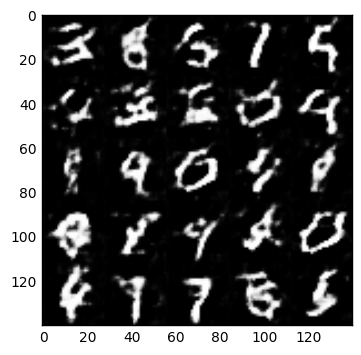

Epoch 1/2... Discriminator Loss: 1.2882... Generator Loss: 0.5359
Epoch 1/2... Discriminator Loss: 1.6347... Generator Loss: 0.5249
Epoch 1/2... Discriminator Loss: 1.3323... Generator Loss: 0.6104
Epoch 1/2... Discriminator Loss: 1.3699... Generator Loss: 0.7248
Epoch 1/2... Discriminator Loss: 1.3219... Generator Loss: 0.5240
Epoch 1/2... Discriminator Loss: 1.5455... Generator Loss: 0.4067
Epoch 1/2... Discriminator Loss: 1.3492... Generator Loss: 0.5963
Epoch 1/2... Discriminator Loss: 1.6162... Generator Loss: 0.5327
Epoch 1/2... Discriminator Loss: 1.4274... Generator Loss: 0.6034
Epoch 1/2... Discriminator Loss: 1.4441... Generator Loss: 0.7450


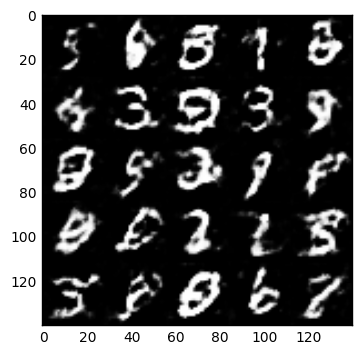

Epoch 1/2... Discriminator Loss: 1.3418... Generator Loss: 0.6798
Epoch 1/2... Discriminator Loss: 1.6497... Generator Loss: 0.2776
Epoch 1/2... Discriminator Loss: 1.3399... Generator Loss: 0.6567
Epoch 1/2... Discriminator Loss: 1.9475... Generator Loss: 0.3988
Epoch 1/2... Discriminator Loss: 1.3620... Generator Loss: 0.7801
Epoch 1/2... Discriminator Loss: 1.5047... Generator Loss: 0.7802
Epoch 1/2... Discriminator Loss: 1.2563... Generator Loss: 0.9807
Epoch 1/2... Discriminator Loss: 1.3148... Generator Loss: 0.9128
Epoch 1/2... Discriminator Loss: 1.2732... Generator Loss: 0.9535
Epoch 1/2... Discriminator Loss: 1.4276... Generator Loss: 0.6619


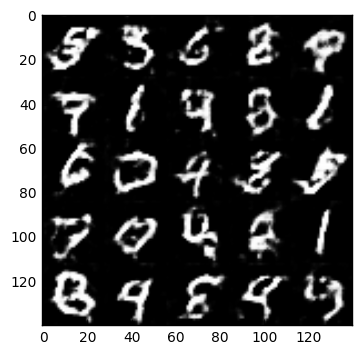

Epoch 1/2... Discriminator Loss: 1.4214... Generator Loss: 0.4602
Epoch 1/2... Discriminator Loss: 1.3399... Generator Loss: 0.6047
Epoch 1/2... Discriminator Loss: 1.7215... Generator Loss: 0.3607
Epoch 1/2... Discriminator Loss: 1.5158... Generator Loss: 0.6791
Epoch 1/2... Discriminator Loss: 1.6403... Generator Loss: 0.4699
Epoch 1/2... Discriminator Loss: 2.4658... Generator Loss: 0.2377
Epoch 1/2... Discriminator Loss: 1.4130... Generator Loss: 0.4280
Epoch 1/2... Discriminator Loss: 1.2552... Generator Loss: 0.7891
Epoch 1/2... Discriminator Loss: 1.6254... Generator Loss: 0.4016
Epoch 1/2... Discriminator Loss: 1.3663... Generator Loss: 0.8028


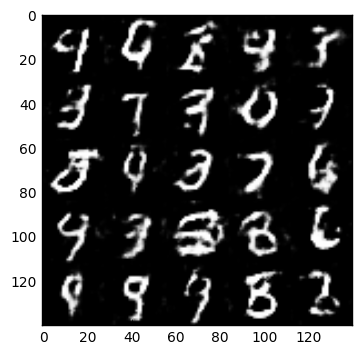

Epoch 1/2... Discriminator Loss: 1.4136... Generator Loss: 0.4788
Epoch 1/2... Discriminator Loss: 1.3897... Generator Loss: 0.7168
Epoch 1/2... Discriminator Loss: 1.4813... Generator Loss: 0.6489
Epoch 1/2... Discriminator Loss: 1.5579... Generator Loss: 0.4416
Epoch 1/2... Discriminator Loss: 1.5467... Generator Loss: 0.5272
Epoch 1/2... Discriminator Loss: 1.5908... Generator Loss: 0.4195
Epoch 1/2... Discriminator Loss: 2.3352... Generator Loss: 0.1036
Epoch 1/2... Discriminator Loss: 1.3437... Generator Loss: 0.8261
Epoch 1/2... Discriminator Loss: 1.6321... Generator Loss: 0.4901
Epoch 1/2... Discriminator Loss: 1.6343... Generator Loss: 0.4479


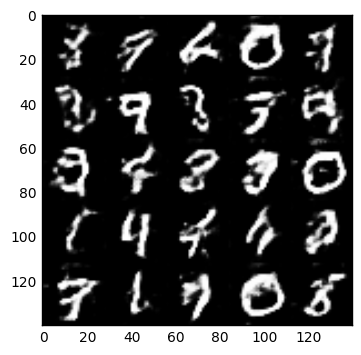

Epoch 1/2... Discriminator Loss: 1.5049... Generator Loss: 0.4659
Epoch 1/2... Discriminator Loss: 1.6437... Generator Loss: 0.4425
Epoch 1/2... Discriminator Loss: 1.3966... Generator Loss: 0.6013
Epoch 1/2... Discriminator Loss: 1.4264... Generator Loss: 0.6426
Epoch 1/2... Discriminator Loss: 1.3782... Generator Loss: 0.5760
Epoch 1/2... Discriminator Loss: 1.5314... Generator Loss: 0.4303
Epoch 1/2... Discriminator Loss: 1.7092... Generator Loss: 0.3717
Epoch 1/2... Discriminator Loss: 1.7849... Generator Loss: 0.3481
Epoch 1/2... Discriminator Loss: 2.6546... Generator Loss: 0.1495
Epoch 1/2... Discriminator Loss: 1.8993... Generator Loss: 0.3063


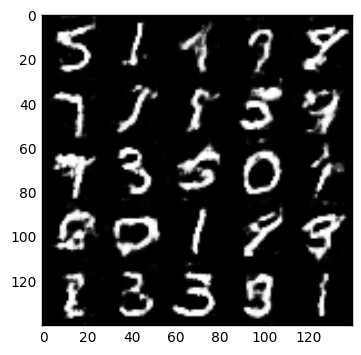

Epoch 1/2... Discriminator Loss: 1.6250... Generator Loss: 0.4430
Epoch 1/2... Discriminator Loss: 1.5505... Generator Loss: 0.3412
Epoch 1/2... Discriminator Loss: 1.5988... Generator Loss: 0.4208
Epoch 1/2... Discriminator Loss: 1.7836... Generator Loss: 0.3259
Epoch 1/2... Discriminator Loss: 1.5249... Generator Loss: 0.4312
Epoch 1/2... Discriminator Loss: 1.3479... Generator Loss: 0.4627
Epoch 1/2... Discriminator Loss: 1.4230... Generator Loss: 0.7620
Epoch 1/2... Discriminator Loss: 1.4654... Generator Loss: 0.6302
Epoch 1/2... Discriminator Loss: 1.5544... Generator Loss: 0.6693
Epoch 1/2... Discriminator Loss: 1.8807... Generator Loss: 0.2947


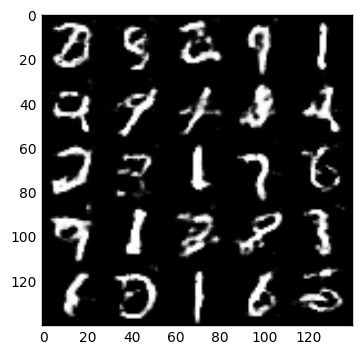

Epoch 1/2... Discriminator Loss: 2.0897... Generator Loss: 0.9027
Epoch 1/2... Discriminator Loss: 1.4533... Generator Loss: 0.4139
Epoch 1/2... Discriminator Loss: 1.3854... Generator Loss: 0.4986
Epoch 1/2... Discriminator Loss: 1.5724... Generator Loss: 0.2541
Epoch 1/2... Discriminator Loss: 1.5198... Generator Loss: 0.5529
Epoch 1/2... Discriminator Loss: 1.5151... Generator Loss: 0.3662
Epoch 1/2... Discriminator Loss: 1.7221... Generator Loss: 0.3046
Epoch 1/2... Discriminator Loss: 1.5263... Generator Loss: 0.3784
Epoch 1/2... Discriminator Loss: 1.2729... Generator Loss: 0.6575
Epoch 1/2... Discriminator Loss: 1.7696... Generator Loss: 0.3769


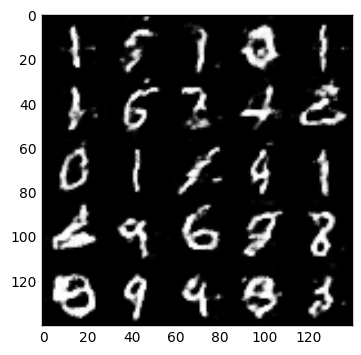

Epoch 1/2... Discriminator Loss: 1.5681... Generator Loss: 0.5802
Epoch 1/2... Discriminator Loss: 2.1051... Generator Loss: 0.1910
Epoch 1/2... Discriminator Loss: 1.5050... Generator Loss: 0.4194
Epoch 1/2... Discriminator Loss: 1.2749... Generator Loss: 0.7750
Epoch 1/2... Discriminator Loss: 1.5552... Generator Loss: 0.3883
Epoch 1/2... Discriminator Loss: 1.6668... Generator Loss: 0.7901
Epoch 1/2... Discriminator Loss: 1.5319... Generator Loss: 0.5141
Epoch 1/2... Discriminator Loss: 1.4583... Generator Loss: 0.5997
Epoch 1/2... Discriminator Loss: 1.5434... Generator Loss: 0.6021
Epoch 1/2... Discriminator Loss: 1.6930... Generator Loss: 0.2388


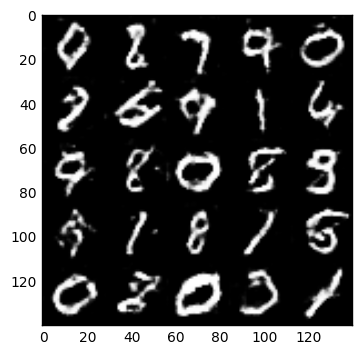

Epoch 1/2... Discriminator Loss: 1.5654... Generator Loss: 0.5877
Epoch 1/2... Discriminator Loss: 1.4889... Generator Loss: 0.3453
Epoch 1/2... Discriminator Loss: 1.8253... Generator Loss: 0.2332
Epoch 1/2... Discriminator Loss: 1.3196... Generator Loss: 0.5188
Epoch 1/2... Discriminator Loss: 1.6699... Generator Loss: 0.2685
Epoch 1/2... Discriminator Loss: 2.2446... Generator Loss: 0.1871
Epoch 1/2... Discriminator Loss: 1.8169... Generator Loss: 0.1128
Epoch 1/2... Discriminator Loss: 1.6868... Generator Loss: 0.1420
Epoch 1/2... Discriminator Loss: 1.4892... Generator Loss: 0.4284
Epoch 1/2... Discriminator Loss: 1.4810... Generator Loss: 0.4187


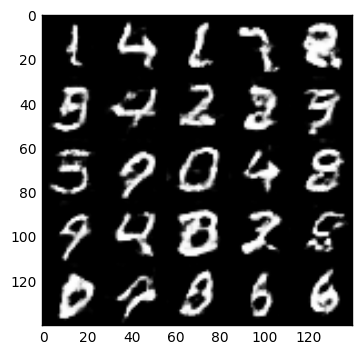

Epoch 1/2... Discriminator Loss: 1.3931... Generator Loss: 0.4985
Epoch 1/2... Discriminator Loss: 1.8715... Generator Loss: 0.3797
Epoch 1/2... Discriminator Loss: 1.4334... Generator Loss: 0.6653
Epoch 1/2... Discriminator Loss: 1.7161... Generator Loss: 0.4832
Epoch 1/2... Discriminator Loss: 1.4987... Generator Loss: 0.4656
Epoch 1/2... Discriminator Loss: 2.1679... Generator Loss: 0.2691
Epoch 1/2... Discriminator Loss: 1.4472... Generator Loss: 0.4414
Epoch 1/2... Discriminator Loss: 1.9374... Generator Loss: 0.4376
Epoch 1/2... Discriminator Loss: 1.7952... Generator Loss: 0.6800
Epoch 1/2... Discriminator Loss: 1.4698... Generator Loss: 0.4583


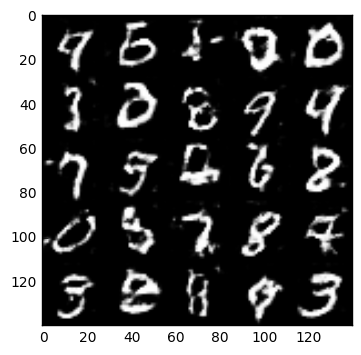

Epoch 1/2... Discriminator Loss: 1.7722... Generator Loss: 0.4208
Epoch 1/2... Discriminator Loss: 1.8153... Generator Loss: 0.3915
Epoch 1/2... Discriminator Loss: 1.2823... Generator Loss: 1.0666
Epoch 1/2... Discriminator Loss: 1.2402... Generator Loss: 0.6818
Epoch 1/2... Discriminator Loss: 2.0245... Generator Loss: 0.2215
Epoch 1/2... Discriminator Loss: 2.7776... Generator Loss: 0.0409
Epoch 1/2... Discriminator Loss: 1.5802... Generator Loss: 0.3688
Epoch 1/2... Discriminator Loss: 1.5405... Generator Loss: 0.3771
Epoch 1/2... Discriminator Loss: 1.6668... Generator Loss: 0.4116
Epoch 1/2... Discriminator Loss: 1.4653... Generator Loss: 0.3232


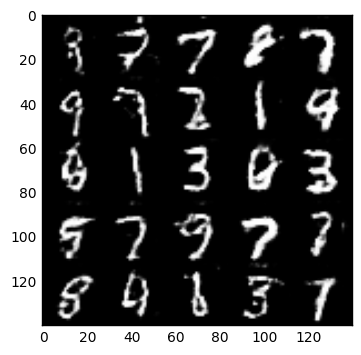

Epoch 1/2... Discriminator Loss: 1.9198... Generator Loss: 0.3833
Epoch 1/2... Discriminator Loss: 2.0618... Generator Loss: 0.2856
Epoch 1/2... Discriminator Loss: 4.0885... Generator Loss: -0.0457
Epoch 1/2... Discriminator Loss: 1.3827... Generator Loss: 0.3963
Epoch 1/2... Discriminator Loss: 1.3875... Generator Loss: 0.4823
Epoch 1/2... Discriminator Loss: 1.6232... Generator Loss: 0.3120
Epoch 1/2... Discriminator Loss: 1.6686... Generator Loss: 0.3058
Epoch 1/2... Discriminator Loss: 1.4418... Generator Loss: 0.5699
Epoch 1/2... Discriminator Loss: 2.0288... Generator Loss: -0.0334
Epoch 1/2... Discriminator Loss: 1.3477... Generator Loss: 0.6267


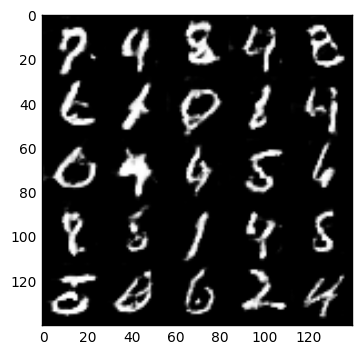

Epoch 1/2... Discriminator Loss: 1.5272... Generator Loss: 0.3414
Epoch 1/2... Discriminator Loss: 1.4984... Generator Loss: 0.5417
Epoch 1/2... Discriminator Loss: 1.9930... Generator Loss: 0.4403
Epoch 1/2... Discriminator Loss: 1.5432... Generator Loss: 0.3280
Epoch 1/2... Discriminator Loss: 2.0904... Generator Loss: 0.3462
Epoch 1/2... Discriminator Loss: 2.5325... Generator Loss: -0.0032
Epoch 1/2... Discriminator Loss: 1.8659... Generator Loss: 0.3810
Epoch 1/2... Discriminator Loss: 1.7052... Generator Loss: 0.3618
Epoch 2/2... Discriminator Loss: 2.2266... Generator Loss: 0.1675
Epoch 2/2... Discriminator Loss: 1.4823... Generator Loss: 0.6011
Epoch 2/2... Discriminator Loss: 3.4877... Generator Loss: -0.0785
Epoch 2/2... Discriminator Loss: 1.1888... Generator Loss: 0.5952
Epoch 2/2... Discriminator Loss: 1.3925... Generator Loss: 0.5415
Epoch 2/2... Discriminator Loss: 2.0752... Generator Loss: 0.1934
Epoch 2/2... Discriminator Loss: 1.6185... Generator Loss: 0.2530
Epoch 2/

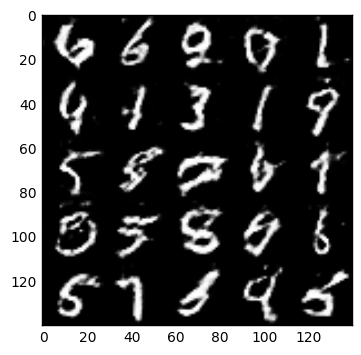

Epoch 2/2... Discriminator Loss: 1.4613... Generator Loss: 0.6759
Epoch 2/2... Discriminator Loss: 1.4728... Generator Loss: 0.4718
Epoch 2/2... Discriminator Loss: 1.7262... Generator Loss: 0.3023
Epoch 2/2... Discriminator Loss: 2.1229... Generator Loss: 0.2001
Epoch 2/2... Discriminator Loss: 1.8263... Generator Loss: 0.2074
Epoch 2/2... Discriminator Loss: 1.8699... Generator Loss: 0.3299
Epoch 2/2... Discriminator Loss: 1.8074... Generator Loss: 0.1977
Epoch 2/2... Discriminator Loss: 1.5688... Generator Loss: 0.4099
Epoch 2/2... Discriminator Loss: 1.6515... Generator Loss: 0.2710
Epoch 2/2... Discriminator Loss: 1.6489... Generator Loss: 0.4890


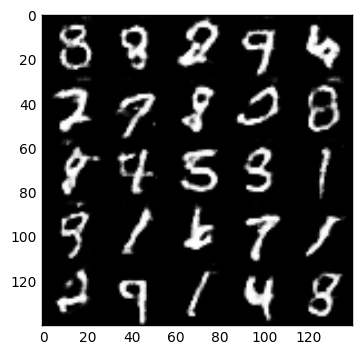

Epoch 2/2... Discriminator Loss: 1.5874... Generator Loss: 0.2208
Epoch 2/2... Discriminator Loss: 1.6955... Generator Loss: 0.2471
Epoch 2/2... Discriminator Loss: 1.2197... Generator Loss: 0.5696
Epoch 2/2... Discriminator Loss: 1.4817... Generator Loss: 0.4387
Epoch 2/2... Discriminator Loss: 2.6931... Generator Loss: 0.2270
Epoch 2/2... Discriminator Loss: 2.2322... Generator Loss: 0.3202
Epoch 2/2... Discriminator Loss: 1.4340... Generator Loss: 0.4080
Epoch 2/2... Discriminator Loss: 1.9934... Generator Loss: 0.3580
Epoch 2/2... Discriminator Loss: 1.3102... Generator Loss: 0.5786
Epoch 2/2... Discriminator Loss: 1.5368... Generator Loss: 0.4742


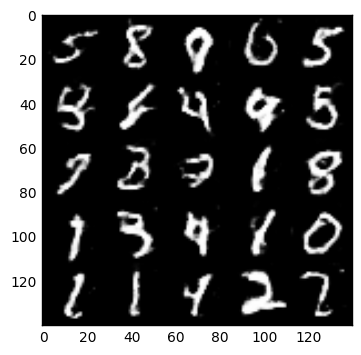

Epoch 2/2... Discriminator Loss: 1.7351... Generator Loss: 0.3352
Epoch 2/2... Discriminator Loss: 1.9043... Generator Loss: 0.3457
Epoch 2/2... Discriminator Loss: 1.3945... Generator Loss: 0.5599
Epoch 2/2... Discriminator Loss: 1.8863... Generator Loss: 0.3487
Epoch 2/2... Discriminator Loss: 1.7283... Generator Loss: 0.3949
Epoch 2/2... Discriminator Loss: 1.5042... Generator Loss: 0.3840
Epoch 2/2... Discriminator Loss: 1.4351... Generator Loss: 0.5859
Epoch 2/2... Discriminator Loss: 2.7558... Generator Loss: 0.1833
Epoch 2/2... Discriminator Loss: 1.2128... Generator Loss: 0.5735
Epoch 2/2... Discriminator Loss: 2.4624... Generator Loss: 0.2879


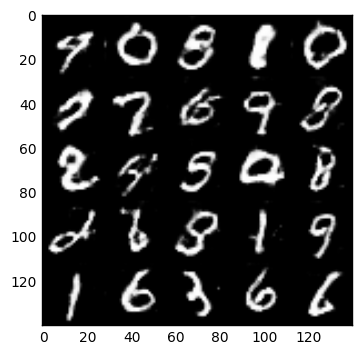

Epoch 2/2... Discriminator Loss: 1.8488... Generator Loss: 0.1253
Epoch 2/2... Discriminator Loss: 2.1071... Generator Loss: 0.1604
Epoch 2/2... Discriminator Loss: 2.4190... Generator Loss: 0.1350
Epoch 2/2... Discriminator Loss: 1.5781... Generator Loss: 0.3075
Epoch 2/2... Discriminator Loss: 1.7977... Generator Loss: 0.1345
Epoch 2/2... Discriminator Loss: 1.7571... Generator Loss: 0.2165
Epoch 2/2... Discriminator Loss: 2.2837... Generator Loss: 0.1037
Epoch 2/2... Discriminator Loss: 1.8089... Generator Loss: 0.2597
Epoch 2/2... Discriminator Loss: 1.4866... Generator Loss: 0.5938
Epoch 2/2... Discriminator Loss: 1.6239... Generator Loss: 0.2657


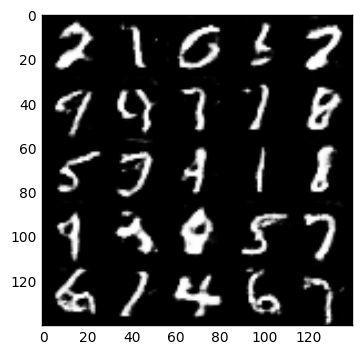

Epoch 2/2... Discriminator Loss: 2.2061... Generator Loss: 0.1145
Epoch 2/2... Discriminator Loss: 2.8530... Generator Loss: 0.1727
Epoch 2/2... Discriminator Loss: 2.3268... Generator Loss: 0.3435
Epoch 2/2... Discriminator Loss: 2.0383... Generator Loss: 0.0310
Epoch 2/2... Discriminator Loss: 1.8984... Generator Loss: 1.2342
Epoch 2/2... Discriminator Loss: 1.7909... Generator Loss: 0.1479
Epoch 2/2... Discriminator Loss: 1.5795... Generator Loss: 0.5105
Epoch 2/2... Discriminator Loss: 1.9058... Generator Loss: 0.2778
Epoch 2/2... Discriminator Loss: 1.5714... Generator Loss: 0.2170
Epoch 2/2... Discriminator Loss: 1.9098... Generator Loss: 0.4294


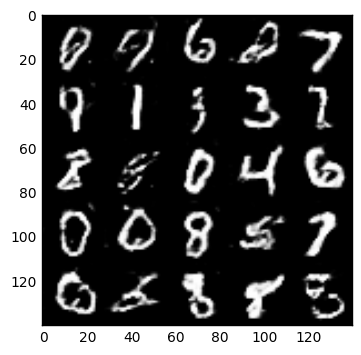

Epoch 2/2... Discriminator Loss: 1.1356... Generator Loss: 0.8237
Epoch 2/2... Discriminator Loss: 1.6933... Generator Loss: 0.4107
Epoch 2/2... Discriminator Loss: 2.0655... Generator Loss: 0.1317
Epoch 2/2... Discriminator Loss: 2.0412... Generator Loss: 0.3313
Epoch 2/2... Discriminator Loss: 1.6796... Generator Loss: 0.4651
Epoch 2/2... Discriminator Loss: 1.7927... Generator Loss: 0.4001
Epoch 2/2... Discriminator Loss: 2.2670... Generator Loss: 0.2884
Epoch 2/2... Discriminator Loss: 1.8052... Generator Loss: 0.2226
Epoch 2/2... Discriminator Loss: 1.8498... Generator Loss: 0.2860
Epoch 2/2... Discriminator Loss: 1.7722... Generator Loss: 0.1895


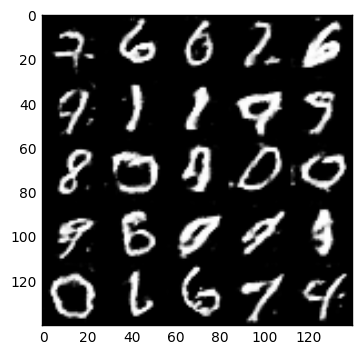

Epoch 2/2... Discriminator Loss: 1.3047... Generator Loss: 0.5471
Epoch 2/2... Discriminator Loss: 1.6483... Generator Loss: 0.4793
Epoch 2/2... Discriminator Loss: 1.2297... Generator Loss: 0.6659
Epoch 2/2... Discriminator Loss: 1.3168... Generator Loss: 0.4751
Epoch 2/2... Discriminator Loss: 2.0148... Generator Loss: 0.2143
Epoch 2/2... Discriminator Loss: 1.5119... Generator Loss: 0.3870
Epoch 2/2... Discriminator Loss: 2.9255... Generator Loss: -0.0479
Epoch 2/2... Discriminator Loss: 1.4589... Generator Loss: 0.5488
Epoch 2/2... Discriminator Loss: 1.4875... Generator Loss: 0.4079
Epoch 2/2... Discriminator Loss: 1.9056... Generator Loss: 0.4636


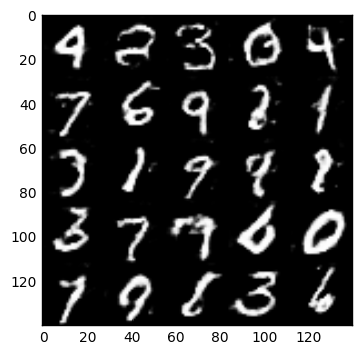

Epoch 2/2... Discriminator Loss: 1.9953... Generator Loss: 0.2328
Epoch 2/2... Discriminator Loss: 2.3367... Generator Loss: 0.2942
Epoch 2/2... Discriminator Loss: 1.1884... Generator Loss: 1.1015
Epoch 2/2... Discriminator Loss: 1.9054... Generator Loss: 0.1788
Epoch 2/2... Discriminator Loss: 2.1798... Generator Loss: 0.2585
Epoch 2/2... Discriminator Loss: 1.8398... Generator Loss: 0.4991
Epoch 2/2... Discriminator Loss: 1.9280... Generator Loss: 0.3291
Epoch 2/2... Discriminator Loss: 1.9753... Generator Loss: 0.3505
Epoch 2/2... Discriminator Loss: 1.7543... Generator Loss: 0.4501
Epoch 2/2... Discriminator Loss: 1.7047... Generator Loss: 0.1302


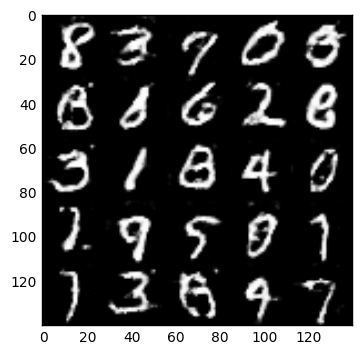

Epoch 2/2... Discriminator Loss: 1.7286... Generator Loss: 0.3738
Epoch 2/2... Discriminator Loss: 1.8851... Generator Loss: 0.3740
Epoch 2/2... Discriminator Loss: 2.4403... Generator Loss: -0.1256
Epoch 2/2... Discriminator Loss: 1.6703... Generator Loss: 0.3420
Epoch 2/2... Discriminator Loss: 2.5051... Generator Loss: 0.1715
Epoch 2/2... Discriminator Loss: 1.3011... Generator Loss: 0.8428
Epoch 2/2... Discriminator Loss: 2.0511... Generator Loss: 0.2536
Epoch 2/2... Discriminator Loss: 1.3823... Generator Loss: 0.5178
Epoch 2/2... Discriminator Loss: 1.7494... Generator Loss: 0.1982
Epoch 2/2... Discriminator Loss: 2.1465... Generator Loss: 0.1797


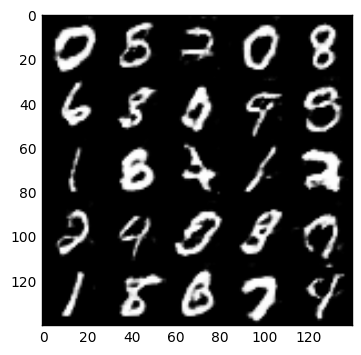

Epoch 2/2... Discriminator Loss: 2.2774... Generator Loss: 0.1687
Epoch 2/2... Discriminator Loss: 2.0056... Generator Loss: 0.2391
Epoch 2/2... Discriminator Loss: 1.7023... Generator Loss: 0.5080
Epoch 2/2... Discriminator Loss: 1.9637... Generator Loss: 0.3621
Epoch 2/2... Discriminator Loss: 2.4195... Generator Loss: 0.1634
Epoch 2/2... Discriminator Loss: 1.3320... Generator Loss: 0.4697
Epoch 2/2... Discriminator Loss: 1.7474... Generator Loss: 0.3301
Epoch 2/2... Discriminator Loss: 1.8884... Generator Loss: 0.1149
Epoch 2/2... Discriminator Loss: 1.8078... Generator Loss: 0.2979
Epoch 2/2... Discriminator Loss: 1.6126... Generator Loss: 0.4926


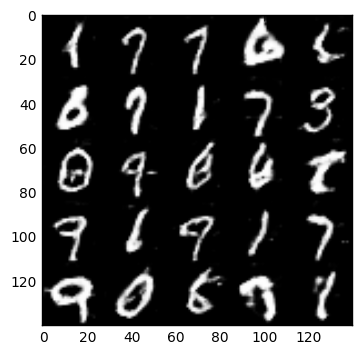

Epoch 2/2... Discriminator Loss: 1.2530... Generator Loss: 0.7431
Epoch 2/2... Discriminator Loss: 1.5127... Generator Loss: 0.4078
Epoch 2/2... Discriminator Loss: 1.6558... Generator Loss: 0.4611
Epoch 2/2... Discriminator Loss: 1.5321... Generator Loss: 0.5474
Epoch 2/2... Discriminator Loss: 1.2971... Generator Loss: 0.6025
Epoch 2/2... Discriminator Loss: 1.5372... Generator Loss: 0.3942
Epoch 2/2... Discriminator Loss: 1.3628... Generator Loss: 0.5740
Epoch 2/2... Discriminator Loss: 1.7347... Generator Loss: 0.3872
Epoch 2/2... Discriminator Loss: 1.6773... Generator Loss: 0.4423
Epoch 2/2... Discriminator Loss: 2.1741... Generator Loss: 0.2455


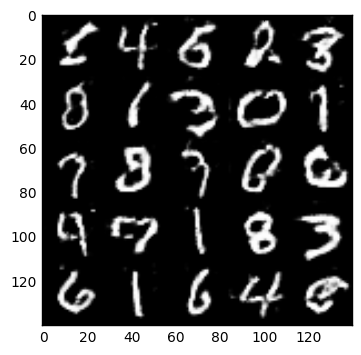

Epoch 2/2... Discriminator Loss: 1.6498... Generator Loss: 0.4928
Epoch 2/2... Discriminator Loss: 1.6426... Generator Loss: 0.4156
Epoch 2/2... Discriminator Loss: 1.7177... Generator Loss: 0.4487
Epoch 2/2... Discriminator Loss: 1.4223... Generator Loss: 0.3909
Epoch 2/2... Discriminator Loss: 2.1752... Generator Loss: 0.2950
Epoch 2/2... Discriminator Loss: 1.9622... Generator Loss: 0.5143
Epoch 2/2... Discriminator Loss: 2.1929... Generator Loss: 0.3408
Epoch 2/2... Discriminator Loss: 1.8753... Generator Loss: 0.2274
Epoch 2/2... Discriminator Loss: 1.8322... Generator Loss: 0.2533
Epoch 2/2... Discriminator Loss: 1.7458... Generator Loss: 0.1865


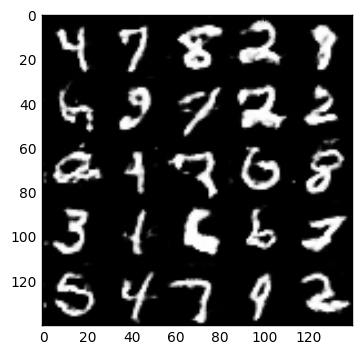

Epoch 2/2... Discriminator Loss: 2.1280... Generator Loss: 0.0079
Epoch 2/2... Discriminator Loss: 1.3586... Generator Loss: 0.4766
Epoch 2/2... Discriminator Loss: 1.8444... Generator Loss: 0.2457
Epoch 2/2... Discriminator Loss: 1.3411... Generator Loss: 1.9075
Epoch 2/2... Discriminator Loss: 1.5756... Generator Loss: 0.3999
Epoch 2/2... Discriminator Loss: 1.6682... Generator Loss: 0.2583
Epoch 2/2... Discriminator Loss: 1.6856... Generator Loss: 0.3444
Epoch 2/2... Discriminator Loss: 1.0776... Generator Loss: 0.7734
Epoch 2/2... Discriminator Loss: 1.8335... Generator Loss: 0.3968
Epoch 2/2... Discriminator Loss: 1.8803... Generator Loss: 0.3095


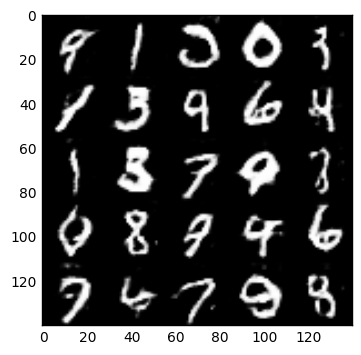

Epoch 2/2... Discriminator Loss: 1.4681... Generator Loss: 0.4210
Epoch 2/2... Discriminator Loss: 1.3870... Generator Loss: 0.5119
Epoch 2/2... Discriminator Loss: 1.7363... Generator Loss: 0.0005
Epoch 2/2... Discriminator Loss: 2.0518... Generator Loss: -0.0254
Epoch 2/2... Discriminator Loss: 1.9003... Generator Loss: 0.2500
Epoch 2/2... Discriminator Loss: 1.6240... Generator Loss: 0.0666
Epoch 2/2... Discriminator Loss: 1.9815... Generator Loss: 0.2409
Epoch 2/2... Discriminator Loss: 2.6329... Generator Loss: -0.0223
Epoch 2/2... Discriminator Loss: 1.8008... Generator Loss: 0.2482
Epoch 2/2... Discriminator Loss: 2.1571... Generator Loss: 0.1110


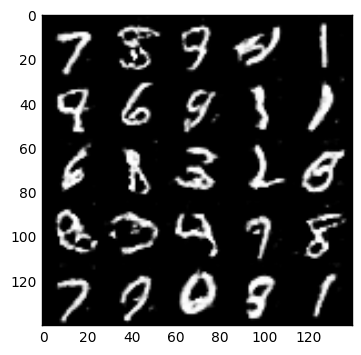

Epoch 2/2... Discriminator Loss: 1.7516... Generator Loss: 0.3910
Epoch 2/2... Discriminator Loss: 2.0446... Generator Loss: 0.2575
Epoch 2/2... Discriminator Loss: 1.9354... Generator Loss: 0.1997
Epoch 2/2... Discriminator Loss: 2.9180... Generator Loss: 3.3663
Epoch 2/2... Discriminator Loss: 2.1069... Generator Loss: 0.2633
Epoch 2/2... Discriminator Loss: 1.5797... Generator Loss: 0.4074
Epoch 2/2... Discriminator Loss: 1.4070... Generator Loss: 0.5018
Epoch 2/2... Discriminator Loss: 1.5374... Generator Loss: 0.3862
Epoch 2/2... Discriminator Loss: 1.9251... Generator Loss: 0.1977
Epoch 2/2... Discriminator Loss: 1.1170... Generator Loss: 1.4329


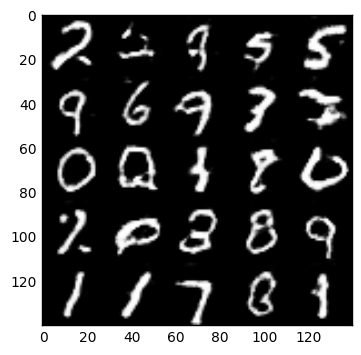

Epoch 2/2... Discriminator Loss: 2.0180... Generator Loss: 0.3863
Epoch 2/2... Discriminator Loss: 1.8166... Generator Loss: 0.4595
Epoch 2/2... Discriminator Loss: 3.2983... Generator Loss: -0.0624
Epoch 2/2... Discriminator Loss: 1.6307... Generator Loss: 0.5759
Epoch 2/2... Discriminator Loss: 1.3448... Generator Loss: 0.4437
Epoch 2/2... Discriminator Loss: 1.5283... Generator Loss: 0.4783
Epoch 2/2... Discriminator Loss: 1.8570... Generator Loss: 0.2383
Epoch 2/2... Discriminator Loss: 1.9409... Generator Loss: 0.1311
Epoch 2/2... Discriminator Loss: 1.8901... Generator Loss: 0.2633
Epoch 2/2... Discriminator Loss: 2.0476... Generator Loss: 0.2390


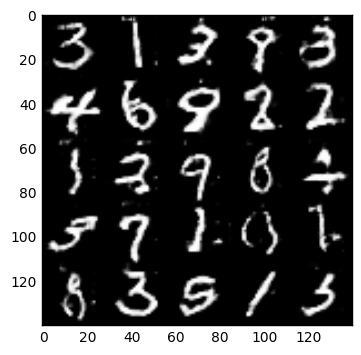

Epoch 2/2... Discriminator Loss: 1.8643... Generator Loss: 0.0556
Epoch 2/2... Discriminator Loss: 2.2239... Generator Loss: 0.0539
Epoch 2/2... Discriminator Loss: 1.7051... Generator Loss: 0.4004
Epoch 2/2... Discriminator Loss: 2.0800... Generator Loss: 0.0226
Epoch 2/2... Discriminator Loss: 1.7708... Generator Loss: 0.2591
Epoch 2/2... Discriminator Loss: 1.8170... Generator Loss: 0.3024
Epoch 2/2... Discriminator Loss: 1.5275... Generator Loss: 0.4816
Epoch 2/2... Discriminator Loss: 2.0712... Generator Loss: 0.1713
Epoch 2/2... Discriminator Loss: 1.8865... Generator Loss: 0.2489
Epoch 2/2... Discriminator Loss: 2.1291... Generator Loss: 0.1677


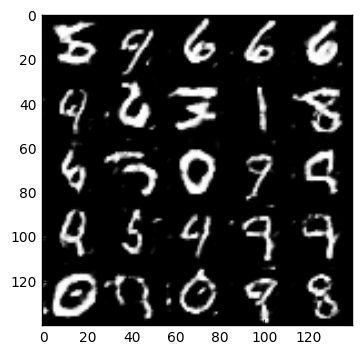

Epoch 2/2... Discriminator Loss: 1.8517... Generator Loss: 0.2592
Epoch 2/2... Discriminator Loss: 2.1331... Generator Loss: 0.2011
Epoch 2/2... Discriminator Loss: 1.8819... Generator Loss: 0.2682
Epoch 2/2... Discriminator Loss: 2.6501... Generator Loss: 0.1796
Epoch 2/2... Discriminator Loss: 2.2601... Generator Loss: 0.0459
Epoch 2/2... Discriminator Loss: 1.7707... Generator Loss: 0.2143
Epoch 2/2... Discriminator Loss: 2.5916... Generator Loss: 0.3564
Epoch 2/2... Discriminator Loss: 1.9021... Generator Loss: 0.1620


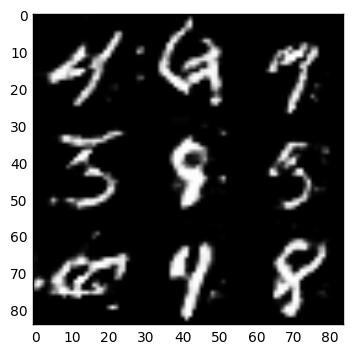

In [12]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Shape:  (202599, 28, 28, 3)
Epoch 1/1... Discriminator Loss: 3.1513... Generator Loss: 0.4133
Epoch 1/1... Discriminator Loss: 1.3971... Generator Loss: 1.8618
Epoch 1/1... Discriminator Loss: 2.3239... Generator Loss: 0.4014
Epoch 1/1... Discriminator Loss: 1.5035... Generator Loss: 0.7445
Epoch 1/1... Discriminator Loss: 1.5846... Generator Loss: 0.6662
Epoch 1/1... Discriminator Loss: 2.0027... Generator Loss: 0.7457
Epoch 1/1... Discriminator Loss: 1.5441... Generator Loss: 0.5446
Epoch 1/1... Discriminator Loss: 1.4434... Generator Loss: 0.6214
Epoch 1/1... Discriminator Loss: 1.4620... Generator Loss: 0.6375


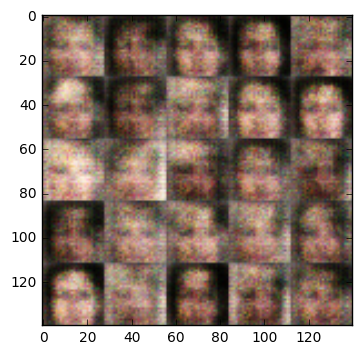

Epoch 1/1... Discriminator Loss: 1.3463... Generator Loss: 0.9039
Epoch 1/1... Discriminator Loss: 1.2995... Generator Loss: 0.7553
Epoch 1/1... Discriminator Loss: 1.5092... Generator Loss: 0.8177
Epoch 1/1... Discriminator Loss: 1.4467... Generator Loss: 0.7330
Epoch 1/1... Discriminator Loss: 1.3358... Generator Loss: 0.7810
Epoch 1/1... Discriminator Loss: 1.7955... Generator Loss: 0.6086
Epoch 1/1... Discriminator Loss: 1.4537... Generator Loss: 0.5412
Epoch 1/1... Discriminator Loss: 1.4872... Generator Loss: 0.7249
Epoch 1/1... Discriminator Loss: 1.4654... Generator Loss: 1.0140
Epoch 1/1... Discriminator Loss: 1.3860... Generator Loss: 0.6441


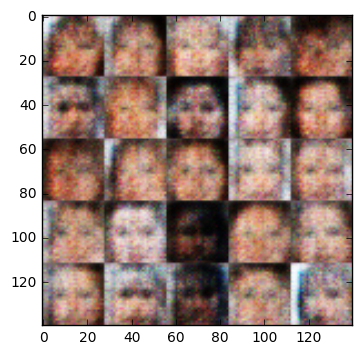

Epoch 1/1... Discriminator Loss: 1.5070... Generator Loss: 0.6050
Epoch 1/1... Discriminator Loss: 1.4821... Generator Loss: 0.6223
Epoch 1/1... Discriminator Loss: 1.5122... Generator Loss: 0.4924
Epoch 1/1... Discriminator Loss: 1.6729... Generator Loss: 0.5933
Epoch 1/1... Discriminator Loss: 1.3933... Generator Loss: 0.7931
Epoch 1/1... Discriminator Loss: 1.6056... Generator Loss: 0.5935
Epoch 1/1... Discriminator Loss: 1.5801... Generator Loss: 0.6980
Epoch 1/1... Discriminator Loss: 1.6540... Generator Loss: 0.8107
Epoch 1/1... Discriminator Loss: 1.5459... Generator Loss: 0.6499
Epoch 1/1... Discriminator Loss: 1.4380... Generator Loss: 0.6370


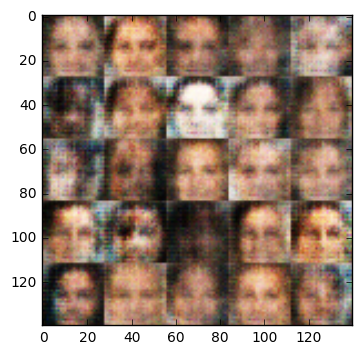

Epoch 1/1... Discriminator Loss: 1.5629... Generator Loss: 0.6012
Epoch 1/1... Discriminator Loss: 1.3776... Generator Loss: 0.6447
Epoch 1/1... Discriminator Loss: 1.5412... Generator Loss: 0.5773
Epoch 1/1... Discriminator Loss: 1.4651... Generator Loss: 0.7974
Epoch 1/1... Discriminator Loss: 1.3712... Generator Loss: 0.8093
Epoch 1/1... Discriminator Loss: 1.3848... Generator Loss: 0.7950
Epoch 1/1... Discriminator Loss: 1.4984... Generator Loss: 0.9467
Epoch 1/1... Discriminator Loss: 1.3837... Generator Loss: 0.7021
Epoch 1/1... Discriminator Loss: 1.4120... Generator Loss: 0.6527
Epoch 1/1... Discriminator Loss: 1.4128... Generator Loss: 0.6395


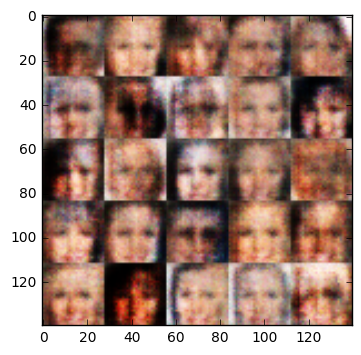

Epoch 1/1... Discriminator Loss: 1.3875... Generator Loss: 0.8442
Epoch 1/1... Discriminator Loss: 1.4117... Generator Loss: 0.7085
Epoch 1/1... Discriminator Loss: 1.4284... Generator Loss: 0.8850
Epoch 1/1... Discriminator Loss: 1.3801... Generator Loss: 0.7011
Epoch 1/1... Discriminator Loss: 1.4164... Generator Loss: 0.7431
Epoch 1/1... Discriminator Loss: 1.4246... Generator Loss: 0.7351
Epoch 1/1... Discriminator Loss: 1.3833... Generator Loss: 0.7666
Epoch 1/1... Discriminator Loss: 1.3849... Generator Loss: 0.6875
Epoch 1/1... Discriminator Loss: 1.3912... Generator Loss: 0.7336
Epoch 1/1... Discriminator Loss: 1.3270... Generator Loss: 0.6920


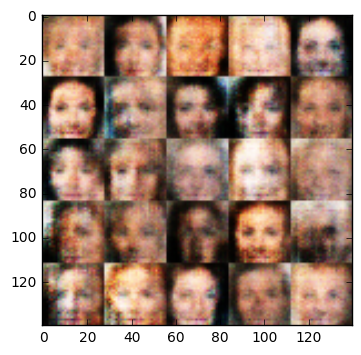

Epoch 1/1... Discriminator Loss: 1.4138... Generator Loss: 0.6860
Epoch 1/1... Discriminator Loss: 1.4288... Generator Loss: 0.7211
Epoch 1/1... Discriminator Loss: 1.4539... Generator Loss: 0.6279
Epoch 1/1... Discriminator Loss: 1.4147... Generator Loss: 0.6763
Epoch 1/1... Discriminator Loss: 1.4604... Generator Loss: 0.6114
Epoch 1/1... Discriminator Loss: 1.4385... Generator Loss: 0.7177
Epoch 1/1... Discriminator Loss: 1.4062... Generator Loss: 0.8858
Epoch 1/1... Discriminator Loss: 1.4389... Generator Loss: 0.7980
Epoch 1/1... Discriminator Loss: 1.4526... Generator Loss: 0.8385
Epoch 1/1... Discriminator Loss: 1.4309... Generator Loss: 0.7621


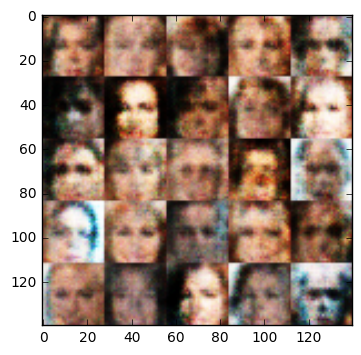

Epoch 1/1... Discriminator Loss: 1.4228... Generator Loss: 0.6918
Epoch 1/1... Discriminator Loss: 1.4476... Generator Loss: 0.8073
Epoch 1/1... Discriminator Loss: 1.3464... Generator Loss: 0.6979
Epoch 1/1... Discriminator Loss: 1.4054... Generator Loss: 0.6896
Epoch 1/1... Discriminator Loss: 1.3879... Generator Loss: 0.8184
Epoch 1/1... Discriminator Loss: 1.4103... Generator Loss: 0.6834
Epoch 1/1... Discriminator Loss: 1.4230... Generator Loss: 0.7624
Epoch 1/1... Discriminator Loss: 1.3902... Generator Loss: 0.8316
Epoch 1/1... Discriminator Loss: 1.4091... Generator Loss: 0.7842
Epoch 1/1... Discriminator Loss: 1.3588... Generator Loss: 0.6885


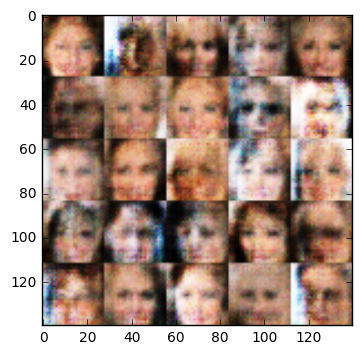

Epoch 1/1... Discriminator Loss: 1.4128... Generator Loss: 0.7448
Epoch 1/1... Discriminator Loss: 1.4068... Generator Loss: 0.6922
Epoch 1/1... Discriminator Loss: 1.4178... Generator Loss: 0.7436
Epoch 1/1... Discriminator Loss: 1.3697... Generator Loss: 0.7196
Epoch 1/1... Discriminator Loss: 1.3922... Generator Loss: 0.7239
Epoch 1/1... Discriminator Loss: 1.3837... Generator Loss: 0.7197
Epoch 1/1... Discriminator Loss: 1.3978... Generator Loss: 0.8382
Epoch 1/1... Discriminator Loss: 1.4958... Generator Loss: 0.6575
Epoch 1/1... Discriminator Loss: 1.4086... Generator Loss: 0.7397
Epoch 1/1... Discriminator Loss: 1.3941... Generator Loss: 0.7375


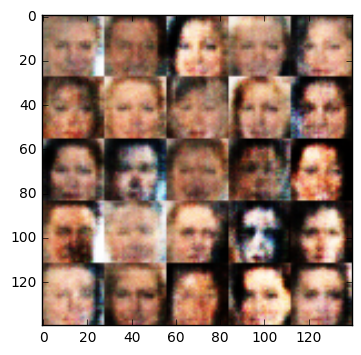

Epoch 1/1... Discriminator Loss: 1.4939... Generator Loss: 0.9216
Epoch 1/1... Discriminator Loss: 1.3600... Generator Loss: 0.7172
Epoch 1/1... Discriminator Loss: 1.4403... Generator Loss: 0.6826
Epoch 1/1... Discriminator Loss: 1.4865... Generator Loss: 0.6692
Epoch 1/1... Discriminator Loss: 1.3951... Generator Loss: 0.7797
Epoch 1/1... Discriminator Loss: 1.4064... Generator Loss: 0.7400
Epoch 1/1... Discriminator Loss: 1.3530... Generator Loss: 0.7803
Epoch 1/1... Discriminator Loss: 1.3961... Generator Loss: 0.7661
Epoch 1/1... Discriminator Loss: 1.3314... Generator Loss: 0.8415
Epoch 1/1... Discriminator Loss: 1.3410... Generator Loss: 0.7770


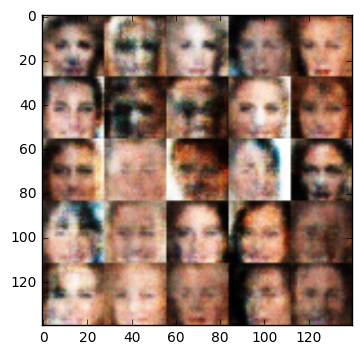

Epoch 1/1... Discriminator Loss: 1.4404... Generator Loss: 0.7288
Epoch 1/1... Discriminator Loss: 1.3969... Generator Loss: 0.6382
Epoch 1/1... Discriminator Loss: 1.4235... Generator Loss: 0.7264
Epoch 1/1... Discriminator Loss: 1.3784... Generator Loss: 0.7253
Epoch 1/1... Discriminator Loss: 1.4755... Generator Loss: 0.7248
Epoch 1/1... Discriminator Loss: 1.3860... Generator Loss: 0.6813
Epoch 1/1... Discriminator Loss: 1.4322... Generator Loss: 0.7048
Epoch 1/1... Discriminator Loss: 1.3598... Generator Loss: 0.6885
Epoch 1/1... Discriminator Loss: 1.4348... Generator Loss: 0.7556
Epoch 1/1... Discriminator Loss: 1.4174... Generator Loss: 0.7601


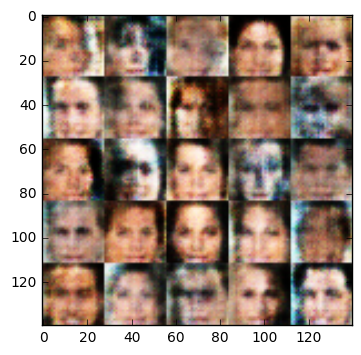

Epoch 1/1... Discriminator Loss: 1.3930... Generator Loss: 0.7450
Epoch 1/1... Discriminator Loss: 1.4031... Generator Loss: 0.6960
Epoch 1/1... Discriminator Loss: 1.4254... Generator Loss: 0.6504
Epoch 1/1... Discriminator Loss: 1.4171... Generator Loss: 0.7128
Epoch 1/1... Discriminator Loss: 1.4948... Generator Loss: 0.7570
Epoch 1/1... Discriminator Loss: 1.3952... Generator Loss: 0.6632
Epoch 1/1... Discriminator Loss: 1.3742... Generator Loss: 0.7815
Epoch 1/1... Discriminator Loss: 1.3894... Generator Loss: 0.7916
Epoch 1/1... Discriminator Loss: 1.5037... Generator Loss: 0.9189
Epoch 1/1... Discriminator Loss: 1.3679... Generator Loss: 0.6885


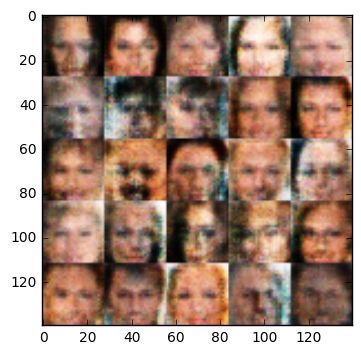

Epoch 1/1... Discriminator Loss: 1.3443... Generator Loss: 0.8179
Epoch 1/1... Discriminator Loss: 1.4067... Generator Loss: 0.8376
Epoch 1/1... Discriminator Loss: 1.4624... Generator Loss: 0.6472
Epoch 1/1... Discriminator Loss: 1.3951... Generator Loss: 0.7286
Epoch 1/1... Discriminator Loss: 1.4469... Generator Loss: 0.5889
Epoch 1/1... Discriminator Loss: 1.4221... Generator Loss: 0.7525
Epoch 1/1... Discriminator Loss: 1.4588... Generator Loss: 0.8726
Epoch 1/1... Discriminator Loss: 1.3710... Generator Loss: 0.6321
Epoch 1/1... Discriminator Loss: 1.4055... Generator Loss: 0.6535
Epoch 1/1... Discriminator Loss: 1.4092... Generator Loss: 0.7317


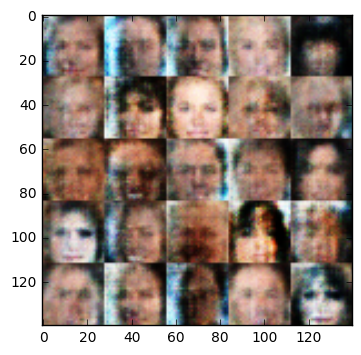

Epoch 1/1... Discriminator Loss: 1.3626... Generator Loss: 0.6866
Epoch 1/1... Discriminator Loss: 1.3896... Generator Loss: 0.7998
Epoch 1/1... Discriminator Loss: 1.4089... Generator Loss: 0.8113
Epoch 1/1... Discriminator Loss: 1.4168... Generator Loss: 0.6924
Epoch 1/1... Discriminator Loss: 1.4131... Generator Loss: 0.7333
Epoch 1/1... Discriminator Loss: 1.3915... Generator Loss: 0.7438
Epoch 1/1... Discriminator Loss: 1.4210... Generator Loss: 0.6485
Epoch 1/1... Discriminator Loss: 1.4551... Generator Loss: 0.7962
Epoch 1/1... Discriminator Loss: 1.3654... Generator Loss: 0.7319
Epoch 1/1... Discriminator Loss: 1.4293... Generator Loss: 0.6771


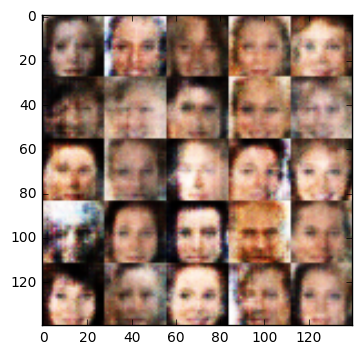

Epoch 1/1... Discriminator Loss: 1.3857... Generator Loss: 0.7583
Epoch 1/1... Discriminator Loss: 1.3819... Generator Loss: 0.6890
Epoch 1/1... Discriminator Loss: 1.4060... Generator Loss: 0.6844
Epoch 1/1... Discriminator Loss: 1.4317... Generator Loss: 0.6287
Epoch 1/1... Discriminator Loss: 1.4070... Generator Loss: 0.6641
Epoch 1/1... Discriminator Loss: 1.4263... Generator Loss: 0.7023
Epoch 1/1... Discriminator Loss: 1.4068... Generator Loss: 0.6722
Epoch 1/1... Discriminator Loss: 1.4237... Generator Loss: 0.7506
Epoch 1/1... Discriminator Loss: 1.4032... Generator Loss: 0.6298
Epoch 1/1... Discriminator Loss: 1.4005... Generator Loss: 0.7049


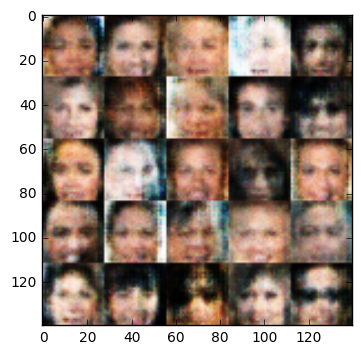

Epoch 1/1... Discriminator Loss: 1.3735... Generator Loss: 0.7189
Epoch 1/1... Discriminator Loss: 1.4169... Generator Loss: 0.7000
Epoch 1/1... Discriminator Loss: 1.4061... Generator Loss: 0.7094
Epoch 1/1... Discriminator Loss: 1.3944... Generator Loss: 0.6748
Epoch 1/1... Discriminator Loss: 1.4583... Generator Loss: 0.6307
Epoch 1/1... Discriminator Loss: 1.3712... Generator Loss: 0.7033
Epoch 1/1... Discriminator Loss: 1.3981... Generator Loss: 0.7247
Epoch 1/1... Discriminator Loss: 1.3854... Generator Loss: 0.6683
Epoch 1/1... Discriminator Loss: 1.4481... Generator Loss: 0.8519
Epoch 1/1... Discriminator Loss: 1.3824... Generator Loss: 0.6938


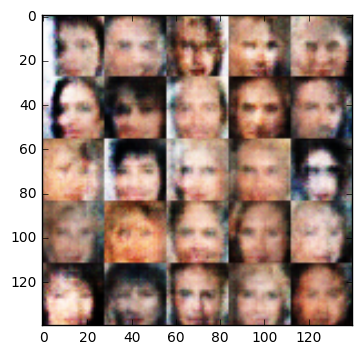

Epoch 1/1... Discriminator Loss: 1.4439... Generator Loss: 0.6560
Epoch 1/1... Discriminator Loss: 1.3764... Generator Loss: 0.7135
Epoch 1/1... Discriminator Loss: 1.3707... Generator Loss: 0.8373
Epoch 1/1... Discriminator Loss: 1.4095... Generator Loss: 0.6680
Epoch 1/1... Discriminator Loss: 1.4382... Generator Loss: 0.7880
Epoch 1/1... Discriminator Loss: 1.3572... Generator Loss: 0.6779
Epoch 1/1... Discriminator Loss: 1.3942... Generator Loss: 0.7952
Epoch 1/1... Discriminator Loss: 1.4351... Generator Loss: 0.8243
Epoch 1/1... Discriminator Loss: 1.3876... Generator Loss: 0.7171
Epoch 1/1... Discriminator Loss: 1.3655... Generator Loss: 0.7923


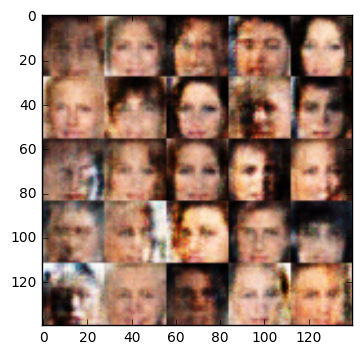

Epoch 1/1... Discriminator Loss: 1.3892... Generator Loss: 0.7626
Epoch 1/1... Discriminator Loss: 1.4161... Generator Loss: 0.7213
Epoch 1/1... Discriminator Loss: 1.3705... Generator Loss: 0.7389
Epoch 1/1... Discriminator Loss: 1.3970... Generator Loss: 0.7487
Epoch 1/1... Discriminator Loss: 1.4202... Generator Loss: 0.7740
Epoch 1/1... Discriminator Loss: 1.4529... Generator Loss: 0.8299
Epoch 1/1... Discriminator Loss: 1.3951... Generator Loss: 0.7009
Epoch 1/1... Discriminator Loss: 1.4016... Generator Loss: 0.6771
Epoch 1/1... Discriminator Loss: 1.3876... Generator Loss: 0.7400
Epoch 1/1... Discriminator Loss: 1.4387... Generator Loss: 0.8622


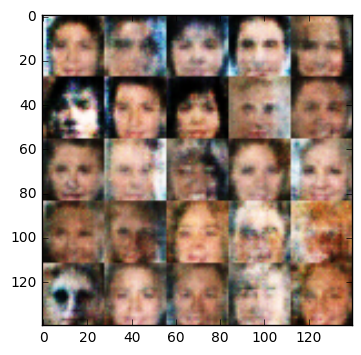

Epoch 1/1... Discriminator Loss: 1.4029... Generator Loss: 0.8410
Epoch 1/1... Discriminator Loss: 1.3775... Generator Loss: 0.6873
Epoch 1/1... Discriminator Loss: 1.3971... Generator Loss: 0.7936
Epoch 1/1... Discriminator Loss: 1.3964... Generator Loss: 0.6976
Epoch 1/1... Discriminator Loss: 1.3887... Generator Loss: 0.7037
Epoch 1/1... Discriminator Loss: 1.3808... Generator Loss: 0.7659
Epoch 1/1... Discriminator Loss: 1.4024... Generator Loss: 0.7084
Epoch 1/1... Discriminator Loss: 1.4264... Generator Loss: 0.7850
Epoch 1/1... Discriminator Loss: 1.3741... Generator Loss: 0.7381
Epoch 1/1... Discriminator Loss: 1.4209... Generator Loss: 0.6933


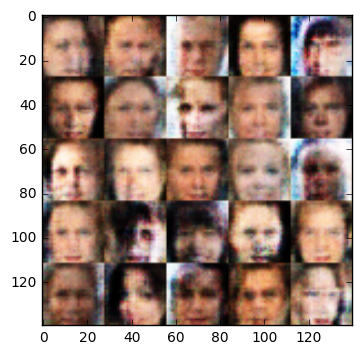

Epoch 1/1... Discriminator Loss: 1.4112... Generator Loss: 0.6645
Epoch 1/1... Discriminator Loss: 1.4217... Generator Loss: 0.8848
Epoch 1/1... Discriminator Loss: 1.4285... Generator Loss: 0.7752
Epoch 1/1... Discriminator Loss: 1.3777... Generator Loss: 0.7785
Epoch 1/1... Discriminator Loss: 1.3779... Generator Loss: 0.7619
Epoch 1/1... Discriminator Loss: 1.4338... Generator Loss: 0.7878
Epoch 1/1... Discriminator Loss: 1.3710... Generator Loss: 0.7111
Epoch 1/1... Discriminator Loss: 1.3713... Generator Loss: 0.7098
Epoch 1/1... Discriminator Loss: 1.3945... Generator Loss: 0.6906
Epoch 1/1... Discriminator Loss: 1.3760... Generator Loss: 0.7252


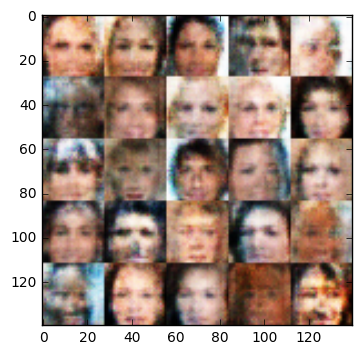

Epoch 1/1... Discriminator Loss: 1.3566... Generator Loss: 0.7811
Epoch 1/1... Discriminator Loss: 1.4230... Generator Loss: 0.7747
Epoch 1/1... Discriminator Loss: 1.3828... Generator Loss: 0.6719
Epoch 1/1... Discriminator Loss: 1.4141... Generator Loss: 0.9374
Epoch 1/1... Discriminator Loss: 1.4128... Generator Loss: 0.6865
Epoch 1/1... Discriminator Loss: 1.3848... Generator Loss: 0.6943
Epoch 1/1... Discriminator Loss: 1.3693... Generator Loss: 0.7341
Epoch 1/1... Discriminator Loss: 1.4210... Generator Loss: 0.7437
Epoch 1/1... Discriminator Loss: 1.3817... Generator Loss: 0.7378
Epoch 1/1... Discriminator Loss: 1.3882... Generator Loss: 0.7646


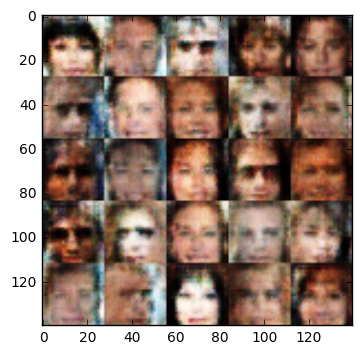

Epoch 1/1... Discriminator Loss: 1.4531... Generator Loss: 0.7890
Epoch 1/1... Discriminator Loss: 1.3939... Generator Loss: 0.9821
Epoch 1/1... Discriminator Loss: 1.3788... Generator Loss: 0.7275
Epoch 1/1... Discriminator Loss: 1.4538... Generator Loss: 0.7912
Epoch 1/1... Discriminator Loss: 1.4027... Generator Loss: 0.7128
Epoch 1/1... Discriminator Loss: 1.4020... Generator Loss: 0.7822
Epoch 1/1... Discriminator Loss: 1.4767... Generator Loss: 0.8023
Epoch 1/1... Discriminator Loss: 1.3768... Generator Loss: 0.7357
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.7011
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.7432


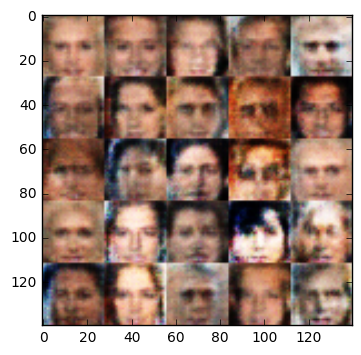

Epoch 1/1... Discriminator Loss: 1.4019... Generator Loss: 0.8565
Epoch 1/1... Discriminator Loss: 1.4298... Generator Loss: 0.8535
Epoch 1/1... Discriminator Loss: 1.3885... Generator Loss: 0.7505
Epoch 1/1... Discriminator Loss: 1.3821... Generator Loss: 0.7062
Epoch 1/1... Discriminator Loss: 1.3970... Generator Loss: 0.7496
Epoch 1/1... Discriminator Loss: 1.3634... Generator Loss: 0.7783
Epoch 1/1... Discriminator Loss: 1.3794... Generator Loss: 0.8282
Epoch 1/1... Discriminator Loss: 1.3850... Generator Loss: 0.7640
Epoch 1/1... Discriminator Loss: 1.3796... Generator Loss: 0.6990
Epoch 1/1... Discriminator Loss: 1.4124... Generator Loss: 0.7121


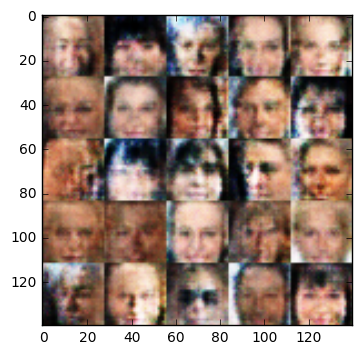

Epoch 1/1... Discriminator Loss: 1.4054... Generator Loss: 0.6709
Epoch 1/1... Discriminator Loss: 1.3917... Generator Loss: 0.6985
Epoch 1/1... Discriminator Loss: 1.3666... Generator Loss: 0.7959
Epoch 1/1... Discriminator Loss: 1.4048... Generator Loss: 0.6348
Epoch 1/1... Discriminator Loss: 1.4131... Generator Loss: 0.8007
Epoch 1/1... Discriminator Loss: 1.3825... Generator Loss: 0.7103
Epoch 1/1... Discriminator Loss: 1.3801... Generator Loss: 0.7423
Epoch 1/1... Discriminator Loss: 1.3771... Generator Loss: 0.7348
Epoch 1/1... Discriminator Loss: 1.4254... Generator Loss: 0.7652
Epoch 1/1... Discriminator Loss: 1.4050... Generator Loss: 0.7191


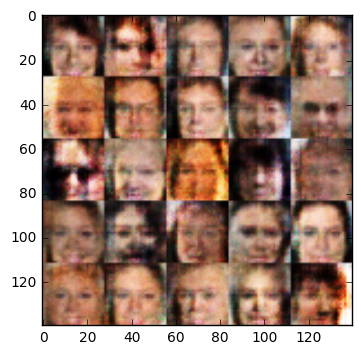

Epoch 1/1... Discriminator Loss: 1.3848... Generator Loss: 0.6807
Epoch 1/1... Discriminator Loss: 1.3635... Generator Loss: 0.7432
Epoch 1/1... Discriminator Loss: 1.4149... Generator Loss: 0.6422
Epoch 1/1... Discriminator Loss: 1.3837... Generator Loss: 0.7222
Epoch 1/1... Discriminator Loss: 1.3898... Generator Loss: 0.6613
Epoch 1/1... Discriminator Loss: 1.3940... Generator Loss: 0.6614
Epoch 1/1... Discriminator Loss: 1.4156... Generator Loss: 0.6654
Epoch 1/1... Discriminator Loss: 1.3915... Generator Loss: 0.6841
Epoch 1/1... Discriminator Loss: 1.3854... Generator Loss: 0.6753
Epoch 1/1... Discriminator Loss: 1.3874... Generator Loss: 0.7363


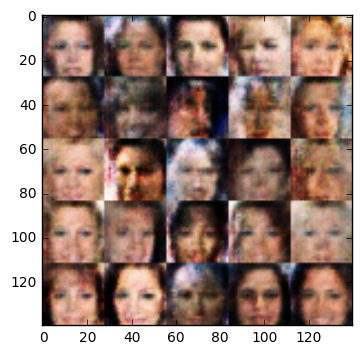

Epoch 1/1... Discriminator Loss: 1.3853... Generator Loss: 0.7065
Epoch 1/1... Discriminator Loss: 1.3862... Generator Loss: 0.7275
Epoch 1/1... Discriminator Loss: 1.3821... Generator Loss: 0.8248
Epoch 1/1... Discriminator Loss: 1.3555... Generator Loss: 0.7464
Epoch 1/1... Discriminator Loss: 1.3744... Generator Loss: 0.7326
Epoch 1/1... Discriminator Loss: 1.4475... Generator Loss: 0.5911
Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.7216
Epoch 1/1... Discriminator Loss: 1.3722... Generator Loss: 0.7908
Epoch 1/1... Discriminator Loss: 1.3767... Generator Loss: 0.7046
Epoch 1/1... Discriminator Loss: 1.4115... Generator Loss: 0.6408


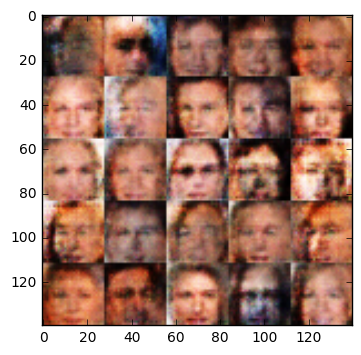

Epoch 1/1... Discriminator Loss: 1.3891... Generator Loss: 0.7234
Epoch 1/1... Discriminator Loss: 1.3675... Generator Loss: 0.7226
Epoch 1/1... Discriminator Loss: 1.3880... Generator Loss: 0.7073
Epoch 1/1... Discriminator Loss: 1.4281... Generator Loss: 0.7058
Epoch 1/1... Discriminator Loss: 1.3700... Generator Loss: 0.7631
Epoch 1/1... Discriminator Loss: 1.4442... Generator Loss: 0.6063
Epoch 1/1... Discriminator Loss: 1.3781... Generator Loss: 0.7090
Epoch 1/1... Discriminator Loss: 1.3602... Generator Loss: 0.7314
Epoch 1/1... Discriminator Loss: 1.3951... Generator Loss: 0.7962
Epoch 1/1... Discriminator Loss: 1.3940... Generator Loss: 0.6428


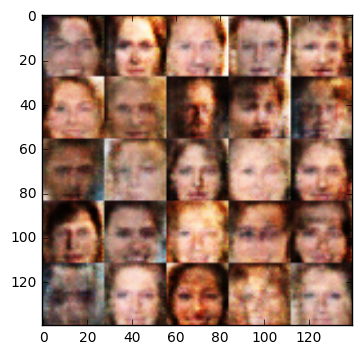

Epoch 1/1... Discriminator Loss: 1.3657... Generator Loss: 0.7303
Epoch 1/1... Discriminator Loss: 1.4115... Generator Loss: 0.7158
Epoch 1/1... Discriminator Loss: 1.3837... Generator Loss: 0.6443
Epoch 1/1... Discriminator Loss: 1.4225... Generator Loss: 0.7655
Epoch 1/1... Discriminator Loss: 1.4185... Generator Loss: 0.7568
Epoch 1/1... Discriminator Loss: 1.4639... Generator Loss: 0.8798
Epoch 1/1... Discriminator Loss: 1.3989... Generator Loss: 0.7393
Epoch 1/1... Discriminator Loss: 1.3683... Generator Loss: 0.7592
Epoch 1/1... Discriminator Loss: 1.4349... Generator Loss: 0.8663
Epoch 1/1... Discriminator Loss: 1.3877... Generator Loss: 0.7611


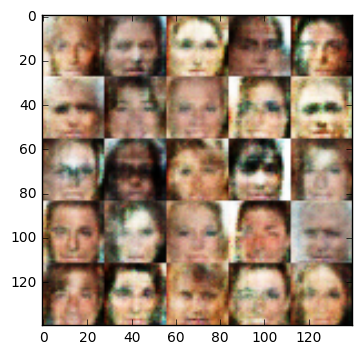

Epoch 1/1... Discriminator Loss: 1.3762... Generator Loss: 0.7284
Epoch 1/1... Discriminator Loss: 1.4241... Generator Loss: 0.7732
Epoch 1/1... Discriminator Loss: 1.4224... Generator Loss: 0.8168
Epoch 1/1... Discriminator Loss: 1.4050... Generator Loss: 0.7050
Epoch 1/1... Discriminator Loss: 1.3316... Generator Loss: 0.8179
Epoch 1/1... Discriminator Loss: 1.4057... Generator Loss: 0.6331
Epoch 1/1... Discriminator Loss: 1.4472... Generator Loss: 0.7907
Epoch 1/1... Discriminator Loss: 1.4011... Generator Loss: 0.7962
Epoch 1/1... Discriminator Loss: 1.3960... Generator Loss: 0.6536
Epoch 1/1... Discriminator Loss: 1.4476... Generator Loss: 0.6392


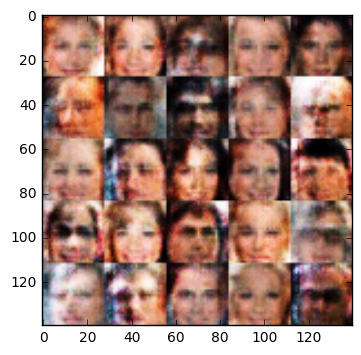

Epoch 1/1... Discriminator Loss: 1.3879... Generator Loss: 0.6919
Epoch 1/1... Discriminator Loss: 1.4061... Generator Loss: 0.7463
Epoch 1/1... Discriminator Loss: 1.3914... Generator Loss: 0.8114
Epoch 1/1... Discriminator Loss: 1.3813... Generator Loss: 0.8322
Epoch 1/1... Discriminator Loss: 1.3947... Generator Loss: 0.7432
Epoch 1/1... Discriminator Loss: 1.4276... Generator Loss: 0.8153
Epoch 1/1... Discriminator Loss: 1.3695... Generator Loss: 0.8533
Epoch 1/1... Discriminator Loss: 1.4405... Generator Loss: 0.7992
Epoch 1/1... Discriminator Loss: 1.3900... Generator Loss: 0.7201
Epoch 1/1... Discriminator Loss: 1.4118... Generator Loss: 0.7503


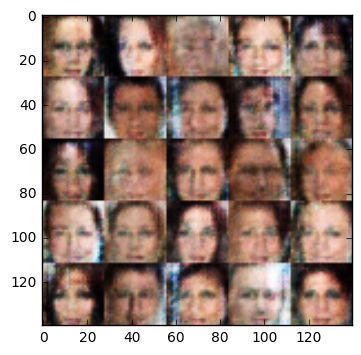

Epoch 1/1... Discriminator Loss: 1.3978... Generator Loss: 0.7385
Epoch 1/1... Discriminator Loss: 1.4135... Generator Loss: 0.7520
Epoch 1/1... Discriminator Loss: 1.3923... Generator Loss: 0.7377
Epoch 1/1... Discriminator Loss: 1.3956... Generator Loss: 0.6790
Epoch 1/1... Discriminator Loss: 1.3888... Generator Loss: 0.7863
Epoch 1/1... Discriminator Loss: 1.3992... Generator Loss: 0.8069
Epoch 1/1... Discriminator Loss: 1.3657... Generator Loss: 0.7328
Epoch 1/1... Discriminator Loss: 1.3546... Generator Loss: 0.7327
Epoch 1/1... Discriminator Loss: 1.3906... Generator Loss: 0.7835
Epoch 1/1... Discriminator Loss: 1.4002... Generator Loss: 0.6913


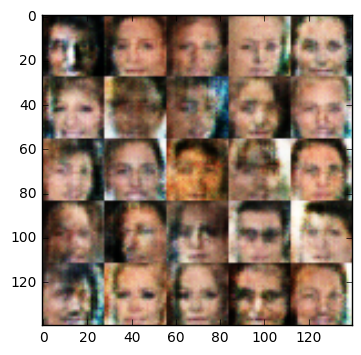

Epoch 1/1... Discriminator Loss: 1.4654... Generator Loss: 0.8676
Epoch 1/1... Discriminator Loss: 1.3529... Generator Loss: 0.7542
Epoch 1/1... Discriminator Loss: 1.3906... Generator Loss: 0.6656
Epoch 1/1... Discriminator Loss: 1.4273... Generator Loss: 0.7566
Epoch 1/1... Discriminator Loss: 1.3700... Generator Loss: 0.7812
Epoch 1/1... Discriminator Loss: 1.3912... Generator Loss: 0.6954
Epoch 1/1... Discriminator Loss: 1.3967... Generator Loss: 0.6964
Epoch 1/1... Discriminator Loss: 1.3403... Generator Loss: 0.8321
Epoch 1/1... Discriminator Loss: 1.3568... Generator Loss: 0.7928
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.6814


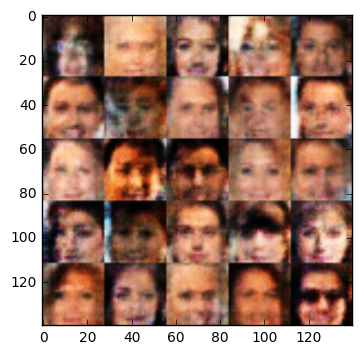

Epoch 1/1... Discriminator Loss: 1.3850... Generator Loss: 0.6268
Epoch 1/1... Discriminator Loss: 1.3938... Generator Loss: 0.7117
Epoch 1/1... Discriminator Loss: 1.3890... Generator Loss: 0.6885
Epoch 1/1... Discriminator Loss: 1.3824... Generator Loss: 0.8264
Epoch 1/1... Discriminator Loss: 1.3966... Generator Loss: 0.6743
Epoch 1/1... Discriminator Loss: 1.4137... Generator Loss: 0.8293
Epoch 1/1... Discriminator Loss: 1.3686... Generator Loss: 0.7511
Epoch 1/1... Discriminator Loss: 1.3940... Generator Loss: 0.6865
Epoch 1/1... Discriminator Loss: 1.3738... Generator Loss: 0.7311
Epoch 1/1... Discriminator Loss: 1.4008... Generator Loss: 0.6491


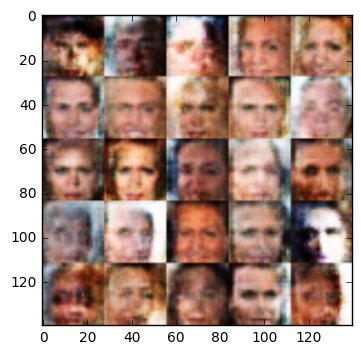

Epoch 1/1... Discriminator Loss: 1.4133... Generator Loss: 0.6529
Epoch 1/1... Discriminator Loss: 1.3945... Generator Loss: 0.7273
Epoch 1/1... Discriminator Loss: 1.3762... Generator Loss: 0.7470
Epoch 1/1... Discriminator Loss: 1.4266... Generator Loss: 0.8538
Epoch 1/1... Discriminator Loss: 1.3920... Generator Loss: 0.7119
Epoch 1/1... Discriminator Loss: 1.4001... Generator Loss: 0.7998
Epoch 1/1... Discriminator Loss: 1.3971... Generator Loss: 0.6586
Epoch 1/1... Discriminator Loss: 1.4136... Generator Loss: 0.6928
Epoch 1/1... Discriminator Loss: 1.3759... Generator Loss: 0.8137
Epoch 1/1... Discriminator Loss: 1.3814... Generator Loss: 0.7406


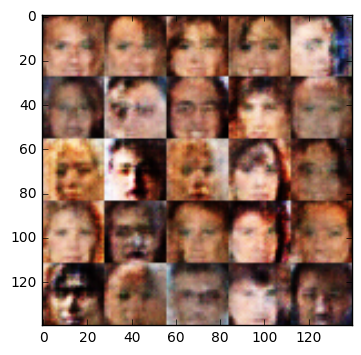

Epoch 1/1... Discriminator Loss: 1.4374... Generator Loss: 0.8280
Epoch 1/1... Discriminator Loss: 1.3937... Generator Loss: 0.6799
Epoch 1/1... Discriminator Loss: 1.4072... Generator Loss: 0.7672
Epoch 1/1... Discriminator Loss: 1.3616... Generator Loss: 0.7443
Epoch 1/1... Discriminator Loss: 1.4543... Generator Loss: 0.8334
Epoch 1/1... Discriminator Loss: 1.3968... Generator Loss: 0.6710
Epoch 1/1... Discriminator Loss: 1.3492... Generator Loss: 0.7637
Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.7438
Epoch 1/1... Discriminator Loss: 1.3923... Generator Loss: 0.7095
Epoch 1/1... Discriminator Loss: 1.3929... Generator Loss: 0.6829


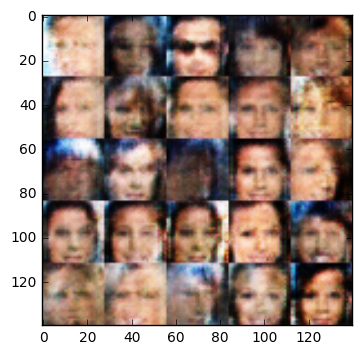

Epoch 1/1... Discriminator Loss: 1.4013... Generator Loss: 0.6855
Epoch 1/1... Discriminator Loss: 1.3632... Generator Loss: 0.8253
Epoch 1/1... Discriminator Loss: 1.3960... Generator Loss: 0.7320
Epoch 1/1... Discriminator Loss: 1.3690... Generator Loss: 0.8956
Epoch 1/1... Discriminator Loss: 1.3974... Generator Loss: 0.7232
Epoch 1/1... Discriminator Loss: 1.3943... Generator Loss: 0.7397
Epoch 1/1... Discriminator Loss: 1.3472... Generator Loss: 0.8206
Epoch 1/1... Discriminator Loss: 1.3589... Generator Loss: 0.7617
Epoch 1/1... Discriminator Loss: 1.3968... Generator Loss: 0.7476
Epoch 1/1... Discriminator Loss: 1.3935... Generator Loss: 0.6814


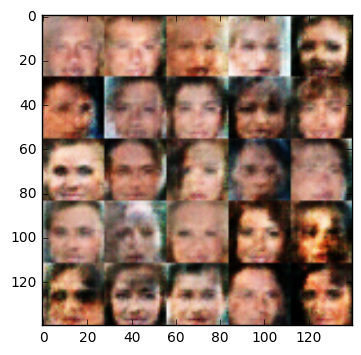

Epoch 1/1... Discriminator Loss: 1.3816... Generator Loss: 0.7061
Epoch 1/1... Discriminator Loss: 1.3737... Generator Loss: 0.7757
Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.7217
Epoch 1/1... Discriminator Loss: 1.3796... Generator Loss: 0.7684
Epoch 1/1... Discriminator Loss: 1.3469... Generator Loss: 0.7914
Epoch 1/1... Discriminator Loss: 1.3759... Generator Loss: 0.7510
Epoch 1/1... Discriminator Loss: 1.3859... Generator Loss: 0.8438
Epoch 1/1... Discriminator Loss: 1.3831... Generator Loss: 0.7143
Epoch 1/1... Discriminator Loss: 1.4039... Generator Loss: 0.6950
Epoch 1/1... Discriminator Loss: 1.4013... Generator Loss: 0.8429


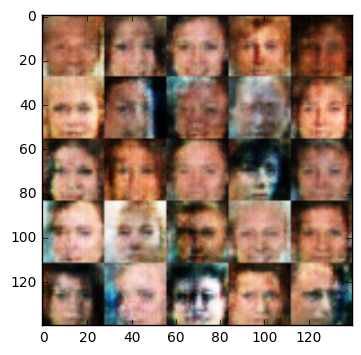

Epoch 1/1... Discriminator Loss: 1.3690... Generator Loss: 0.8394
Epoch 1/1... Discriminator Loss: 1.3875... Generator Loss: 0.7201
Epoch 1/1... Discriminator Loss: 1.3896... Generator Loss: 0.6768
Epoch 1/1... Discriminator Loss: 1.3826... Generator Loss: 0.7558
Epoch 1/1... Discriminator Loss: 1.3694... Generator Loss: 0.7551
Epoch 1/1... Discriminator Loss: 1.3648... Generator Loss: 0.8137
Epoch 1/1... Discriminator Loss: 1.4013... Generator Loss: 0.8089
Epoch 1/1... Discriminator Loss: 1.3817... Generator Loss: 0.7651
Epoch 1/1... Discriminator Loss: 1.4110... Generator Loss: 0.7967
Epoch 1/1... Discriminator Loss: 1.3930... Generator Loss: 0.7607


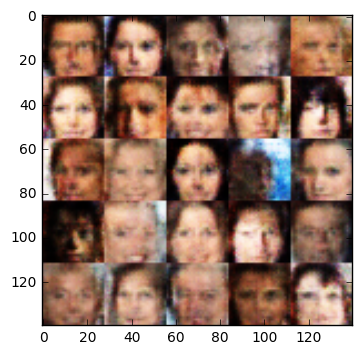

Epoch 1/1... Discriminator Loss: 1.3616... Generator Loss: 0.8032
Epoch 1/1... Discriminator Loss: 1.4261... Generator Loss: 0.6415
Epoch 1/1... Discriminator Loss: 1.3560... Generator Loss: 0.7669
Epoch 1/1... Discriminator Loss: 1.4427... Generator Loss: 0.8334
Epoch 1/1... Discriminator Loss: 1.3717... Generator Loss: 0.7461
Epoch 1/1... Discriminator Loss: 1.3823... Generator Loss: 0.7473
Epoch 1/1... Discriminator Loss: 1.3706... Generator Loss: 0.7035
Epoch 1/1... Discriminator Loss: 1.3280... Generator Loss: 0.8520
Epoch 1/1... Discriminator Loss: 1.3695... Generator Loss: 0.7370
Epoch 1/1... Discriminator Loss: 1.3781... Generator Loss: 0.7047


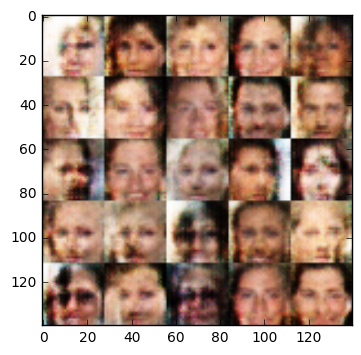

Epoch 1/1... Discriminator Loss: 1.4059... Generator Loss: 0.7911
Epoch 1/1... Discriminator Loss: 1.3842... Generator Loss: 0.6710
Epoch 1/1... Discriminator Loss: 1.3849... Generator Loss: 0.7300
Epoch 1/1... Discriminator Loss: 1.3753... Generator Loss: 0.7072
Epoch 1/1... Discriminator Loss: 1.4088... Generator Loss: 0.8323
Epoch 1/1... Discriminator Loss: 1.3452... Generator Loss: 0.8377
Epoch 1/1... Discriminator Loss: 1.4195... Generator Loss: 0.7610
Epoch 1/1... Discriminator Loss: 1.3454... Generator Loss: 0.7706
Epoch 1/1... Discriminator Loss: 1.3820... Generator Loss: 0.6572
Epoch 1/1... Discriminator Loss: 1.3770... Generator Loss: 0.8776


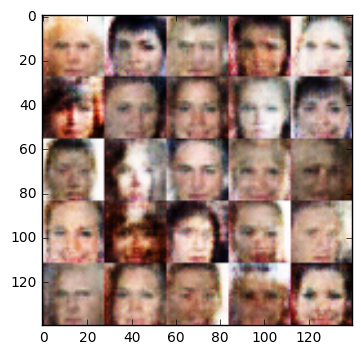

Epoch 1/1... Discriminator Loss: 1.3838... Generator Loss: 0.7035
Epoch 1/1... Discriminator Loss: 1.4075... Generator Loss: 0.8581
Epoch 1/1... Discriminator Loss: 1.3964... Generator Loss: 0.7291
Epoch 1/1... Discriminator Loss: 1.3636... Generator Loss: 0.7395
Epoch 1/1... Discriminator Loss: 1.3806... Generator Loss: 0.7138
Epoch 1/1... Discriminator Loss: 1.4186... Generator Loss: 0.6520
Epoch 1/1... Discriminator Loss: 1.4538... Generator Loss: 0.7971
Epoch 1/1... Discriminator Loss: 1.3990... Generator Loss: 0.8010
Epoch 1/1... Discriminator Loss: 1.3819... Generator Loss: 0.6762
Epoch 1/1... Discriminator Loss: 1.3591... Generator Loss: 0.8004


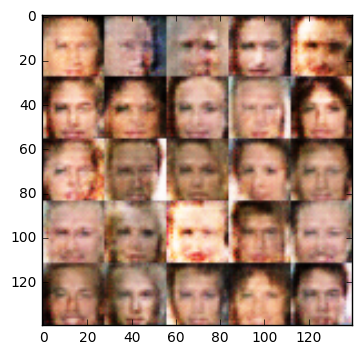

Epoch 1/1... Discriminator Loss: 1.4043... Generator Loss: 0.7607
Epoch 1/1... Discriminator Loss: 1.3908... Generator Loss: 0.7065
Epoch 1/1... Discriminator Loss: 1.3511... Generator Loss: 0.7750
Epoch 1/1... Discriminator Loss: 1.3880... Generator Loss: 0.6881
Epoch 1/1... Discriminator Loss: 1.4072... Generator Loss: 0.8100
Epoch 1/1... Discriminator Loss: 1.3896... Generator Loss: 0.8141
Epoch 1/1... Discriminator Loss: 1.3876... Generator Loss: 0.7192
Epoch 1/1... Discriminator Loss: 1.3972... Generator Loss: 0.7152
Epoch 1/1... Discriminator Loss: 1.3832... Generator Loss: 0.7526
Epoch 1/1... Discriminator Loss: 1.3970... Generator Loss: 0.6951


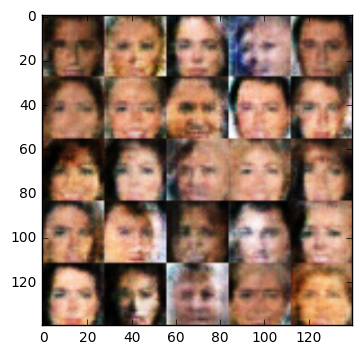

Epoch 1/1... Discriminator Loss: 1.3797... Generator Loss: 0.7048
Epoch 1/1... Discriminator Loss: 1.3698... Generator Loss: 0.8657
Epoch 1/1... Discriminator Loss: 1.3580... Generator Loss: 0.7305
Epoch 1/1... Discriminator Loss: 1.4022... Generator Loss: 0.6684
Epoch 1/1... Discriminator Loss: 1.4157... Generator Loss: 0.7912
Epoch 1/1... Discriminator Loss: 1.3937... Generator Loss: 0.7463
Epoch 1/1... Discriminator Loss: 1.3816... Generator Loss: 0.7214
Epoch 1/1... Discriminator Loss: 1.3558... Generator Loss: 0.7797
Epoch 1/1... Discriminator Loss: 1.3666... Generator Loss: 0.8257
Epoch 1/1... Discriminator Loss: 1.4351... Generator Loss: 0.6013


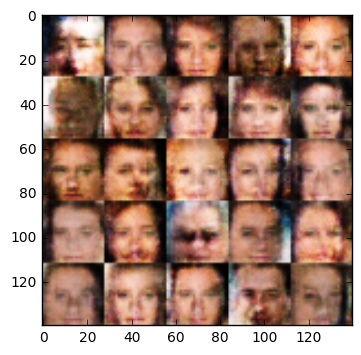

Epoch 1/1... Discriminator Loss: 1.3587... Generator Loss: 0.7635
Epoch 1/1... Discriminator Loss: 1.4022... Generator Loss: 0.8148
Epoch 1/1... Discriminator Loss: 1.3958... Generator Loss: 0.7026
Epoch 1/1... Discriminator Loss: 1.4071... Generator Loss: 0.7729
Epoch 1/1... Discriminator Loss: 1.3677... Generator Loss: 0.7197
Epoch 1/1... Discriminator Loss: 1.3918... Generator Loss: 0.6681
Epoch 1/1... Discriminator Loss: 1.3803... Generator Loss: 0.6899
Epoch 1/1... Discriminator Loss: 1.4075... Generator Loss: 0.7983
Epoch 1/1... Discriminator Loss: 1.3624... Generator Loss: 0.7165
Epoch 1/1... Discriminator Loss: 1.3956... Generator Loss: 0.7226


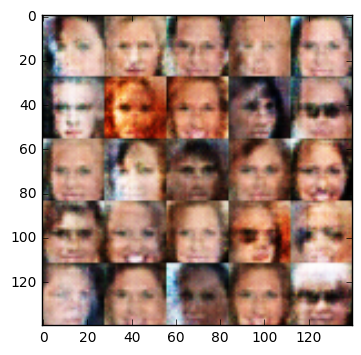

Epoch 1/1... Discriminator Loss: 1.3895... Generator Loss: 0.7253
Epoch 1/1... Discriminator Loss: 1.3820... Generator Loss: 0.7711
Epoch 1/1... Discriminator Loss: 1.3761... Generator Loss: 0.6532
Epoch 1/1... Discriminator Loss: 1.3921... Generator Loss: 0.7163
Epoch 1/1... Discriminator Loss: 1.4021... Generator Loss: 0.7326
Epoch 1/1... Discriminator Loss: 1.4030... Generator Loss: 0.8202
Epoch 1/1... Discriminator Loss: 1.3726... Generator Loss: 0.7113
Epoch 1/1... Discriminator Loss: 1.3986... Generator Loss: 0.7011
Epoch 1/1... Discriminator Loss: 1.3669... Generator Loss: 0.7916
Epoch 1/1... Discriminator Loss: 1.3795... Generator Loss: 0.8302


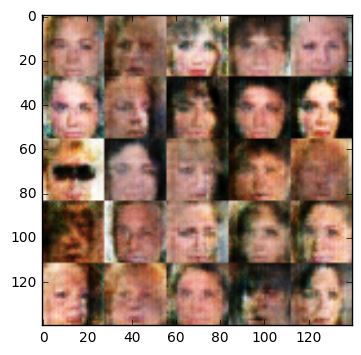

Epoch 1/1... Discriminator Loss: 1.3887... Generator Loss: 0.7205
Epoch 1/1... Discriminator Loss: 1.3777... Generator Loss: 0.7623
Epoch 1/1... Discriminator Loss: 1.3970... Generator Loss: 0.6881
Epoch 1/1... Discriminator Loss: 1.3828... Generator Loss: 0.7531
Epoch 1/1... Discriminator Loss: 1.3809... Generator Loss: 0.8532
Epoch 1/1... Discriminator Loss: 1.3724... Generator Loss: 0.7334
Epoch 1/1... Discriminator Loss: 1.4320... Generator Loss: 0.8398
Epoch 1/1... Discriminator Loss: 1.3951... Generator Loss: 0.6807
Epoch 1/1... Discriminator Loss: 1.3883... Generator Loss: 0.7675
Epoch 1/1... Discriminator Loss: 1.3817... Generator Loss: 0.6992


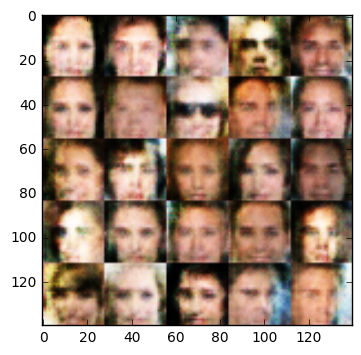

Epoch 1/1... Discriminator Loss: 1.4311... Generator Loss: 0.6267
Epoch 1/1... Discriminator Loss: 1.3675... Generator Loss: 0.8238
Epoch 1/1... Discriminator Loss: 1.4096... Generator Loss: 0.6432
Epoch 1/1... Discriminator Loss: 1.4507... Generator Loss: 0.9572
Epoch 1/1... Discriminator Loss: 1.3527... Generator Loss: 0.7710
Epoch 1/1... Discriminator Loss: 1.3820... Generator Loss: 0.7019
Epoch 1/1... Discriminator Loss: 1.3936... Generator Loss: 0.7820
Epoch 1/1... Discriminator Loss: 1.3947... Generator Loss: 0.7690
Epoch 1/1... Discriminator Loss: 1.4090... Generator Loss: 0.6770
Epoch 1/1... Discriminator Loss: 1.3953... Generator Loss: 0.7662


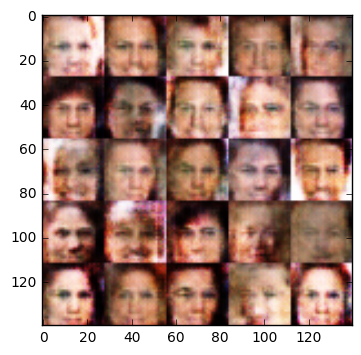

Epoch 1/1... Discriminator Loss: 1.3790... Generator Loss: 0.8065
Epoch 1/1... Discriminator Loss: 1.3841... Generator Loss: 0.6670
Epoch 1/1... Discriminator Loss: 1.3855... Generator Loss: 0.7611
Epoch 1/1... Discriminator Loss: 1.3501... Generator Loss: 0.8286
Epoch 1/1... Discriminator Loss: 1.3803... Generator Loss: 0.7313
Epoch 1/1... Discriminator Loss: 1.3886... Generator Loss: 0.7726
Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.7280
Epoch 1/1... Discriminator Loss: 1.3786... Generator Loss: 0.7218
Epoch 1/1... Discriminator Loss: 1.4039... Generator Loss: 0.7749
Epoch 1/1... Discriminator Loss: 1.3930... Generator Loss: 0.8257


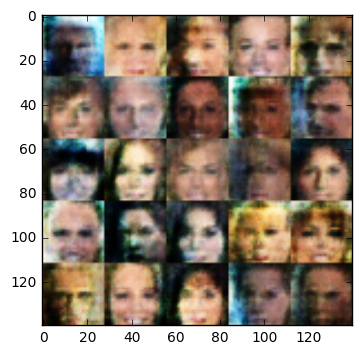

Epoch 1/1... Discriminator Loss: 1.4048... Generator Loss: 0.7115
Epoch 1/1... Discriminator Loss: 1.3819... Generator Loss: 0.7112
Epoch 1/1... Discriminator Loss: 1.3548... Generator Loss: 0.7843
Epoch 1/1... Discriminator Loss: 1.3772... Generator Loss: 0.6902
Epoch 1/1... Discriminator Loss: 1.4181... Generator Loss: 0.6664
Epoch 1/1... Discriminator Loss: 1.3637... Generator Loss: 0.7477
Epoch 1/1... Discriminator Loss: 1.3950... Generator Loss: 0.7337
Epoch 1/1... Discriminator Loss: 1.3841... Generator Loss: 0.7039
Epoch 1/1... Discriminator Loss: 1.3987... Generator Loss: 0.6844
Epoch 1/1... Discriminator Loss: 1.3822... Generator Loss: 0.7255


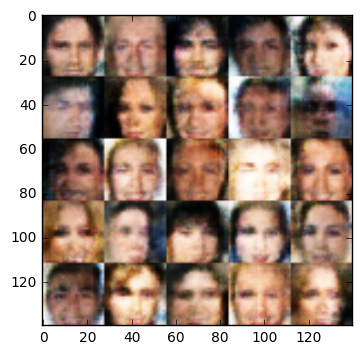

Epoch 1/1... Discriminator Loss: 1.3767... Generator Loss: 0.7826
Epoch 1/1... Discriminator Loss: 1.3674... Generator Loss: 0.7477
Epoch 1/1... Discriminator Loss: 1.3975... Generator Loss: 0.6673
Epoch 1/1... Discriminator Loss: 1.4318... Generator Loss: 0.9282
Epoch 1/1... Discriminator Loss: 1.3853... Generator Loss: 0.7219
Epoch 1/1... Discriminator Loss: 1.3978... Generator Loss: 0.6932
Epoch 1/1... Discriminator Loss: 1.3945... Generator Loss: 0.7384
Epoch 1/1... Discriminator Loss: 1.3934... Generator Loss: 0.7899
Epoch 1/1... Discriminator Loss: 1.3809... Generator Loss: 0.8217
Epoch 1/1... Discriminator Loss: 1.4103... Generator Loss: 0.6571


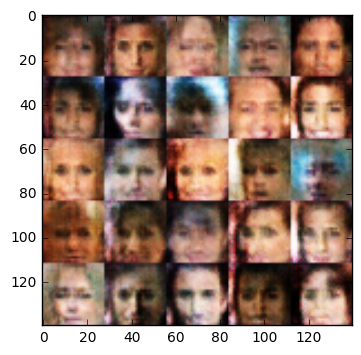

Epoch 1/1... Discriminator Loss: 1.3932... Generator Loss: 0.7203
Epoch 1/1... Discriminator Loss: 1.3767... Generator Loss: 0.7065
Epoch 1/1... Discriminator Loss: 1.3978... Generator Loss: 0.6766
Epoch 1/1... Discriminator Loss: 1.4029... Generator Loss: 0.6547
Epoch 1/1... Discriminator Loss: 1.4363... Generator Loss: 0.8335
Epoch 1/1... Discriminator Loss: 1.4875... Generator Loss: 0.8847
Epoch 1/1... Discriminator Loss: 1.3859... Generator Loss: 0.6943
Epoch 1/1... Discriminator Loss: 1.4009... Generator Loss: 0.6703
Epoch 1/1... Discriminator Loss: 1.3032... Generator Loss: 0.8584
Epoch 1/1... Discriminator Loss: 1.3760... Generator Loss: 0.7247


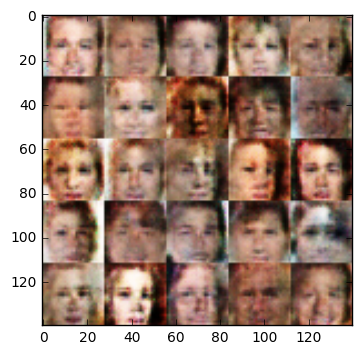

Epoch 1/1... Discriminator Loss: 1.3830... Generator Loss: 0.7483
Epoch 1/1... Discriminator Loss: 1.3889... Generator Loss: 0.8515
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.6598
Epoch 1/1... Discriminator Loss: 1.3785... Generator Loss: 0.7774
Epoch 1/1... Discriminator Loss: 1.3780... Generator Loss: 0.8386
Epoch 1/1... Discriminator Loss: 1.3651... Generator Loss: 0.7358
Epoch 1/1... Discriminator Loss: 1.3656... Generator Loss: 0.7971
Epoch 1/1... Discriminator Loss: 1.3941... Generator Loss: 0.6730
Epoch 1/1... Discriminator Loss: 1.3944... Generator Loss: 0.7562
Epoch 1/1... Discriminator Loss: 1.3911... Generator Loss: 0.8075


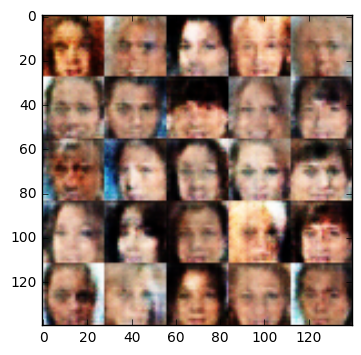

Epoch 1/1... Discriminator Loss: 1.3776... Generator Loss: 0.7163
Epoch 1/1... Discriminator Loss: 1.4134... Generator Loss: 0.8150
Epoch 1/1... Discriminator Loss: 1.3905... Generator Loss: 0.6935
Epoch 1/1... Discriminator Loss: 1.3941... Generator Loss: 0.7982
Epoch 1/1... Discriminator Loss: 1.3833... Generator Loss: 0.7785
Epoch 1/1... Discriminator Loss: 1.3689... Generator Loss: 0.7332
Epoch 1/1... Discriminator Loss: 1.3849... Generator Loss: 0.7355
Epoch 1/1... Discriminator Loss: 1.3841... Generator Loss: 0.7133
Epoch 1/1... Discriminator Loss: 1.3861... Generator Loss: 0.7337
Epoch 1/1... Discriminator Loss: 1.4067... Generator Loss: 0.6836


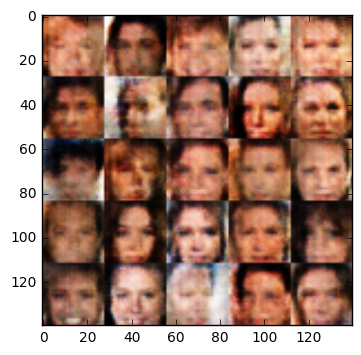

Epoch 1/1... Discriminator Loss: 1.3953... Generator Loss: 0.7291
Epoch 1/1... Discriminator Loss: 1.3413... Generator Loss: 0.7995
Epoch 1/1... Discriminator Loss: 1.3439... Generator Loss: 0.7629
Epoch 1/1... Discriminator Loss: 1.3696... Generator Loss: 0.7582
Epoch 1/1... Discriminator Loss: 1.4040... Generator Loss: 0.6648
Epoch 1/1... Discriminator Loss: 1.3955... Generator Loss: 0.7188
Epoch 1/1... Discriminator Loss: 1.3909... Generator Loss: 0.7352
Epoch 1/1... Discriminator Loss: 1.3785... Generator Loss: 0.8176
Epoch 1/1... Discriminator Loss: 1.3734... Generator Loss: 0.7615
Epoch 1/1... Discriminator Loss: 1.4124... Generator Loss: 0.7377


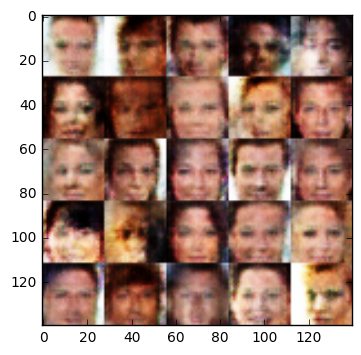

Epoch 1/1... Discriminator Loss: 1.3550... Generator Loss: 0.7462
Epoch 1/1... Discriminator Loss: 1.3961... Generator Loss: 0.6448
Epoch 1/1... Discriminator Loss: 1.3848... Generator Loss: 0.7448
Epoch 1/1... Discriminator Loss: 1.4220... Generator Loss: 0.6530
Epoch 1/1... Discriminator Loss: 1.4029... Generator Loss: 0.8081
Epoch 1/1... Discriminator Loss: 1.3900... Generator Loss: 0.7572
Epoch 1/1... Discriminator Loss: 1.4126... Generator Loss: 0.6720
Epoch 1/1... Discriminator Loss: 1.3823... Generator Loss: 0.7507
Epoch 1/1... Discriminator Loss: 1.4151... Generator Loss: 0.8042
Epoch 1/1... Discriminator Loss: 1.3550... Generator Loss: 0.7883


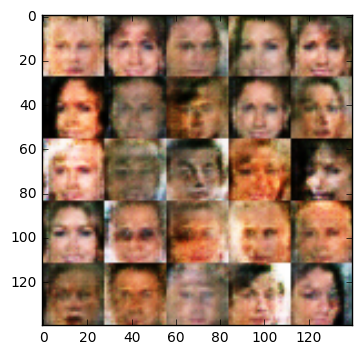

Epoch 1/1... Discriminator Loss: 1.3753... Generator Loss: 0.6583
Epoch 1/1... Discriminator Loss: 1.3945... Generator Loss: 0.8194
Epoch 1/1... Discriminator Loss: 1.3105... Generator Loss: 0.8629
Epoch 1/1... Discriminator Loss: 1.4013... Generator Loss: 0.6368
Epoch 1/1... Discriminator Loss: 1.3664... Generator Loss: 0.7667
Epoch 1/1... Discriminator Loss: 1.3911... Generator Loss: 0.7020
Epoch 1/1... Discriminator Loss: 1.3904... Generator Loss: 0.7506
Epoch 1/1... Discriminator Loss: 1.3701... Generator Loss: 0.7558
Epoch 1/1... Discriminator Loss: 1.3951... Generator Loss: 0.8113
Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.6840


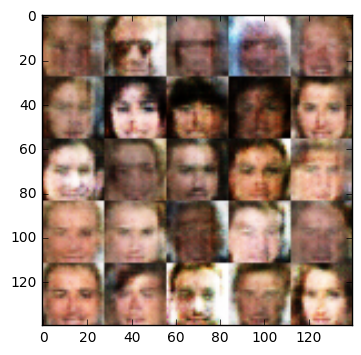

Epoch 1/1... Discriminator Loss: 1.3760... Generator Loss: 0.7015
Epoch 1/1... Discriminator Loss: 1.3956... Generator Loss: 0.6933
Epoch 1/1... Discriminator Loss: 1.3612... Generator Loss: 0.7717
Epoch 1/1... Discriminator Loss: 1.3843... Generator Loss: 0.8759
Epoch 1/1... Discriminator Loss: 1.3826... Generator Loss: 0.6856
Epoch 1/1... Discriminator Loss: 1.3680... Generator Loss: 0.8255
Epoch 1/1... Discriminator Loss: 1.3903... Generator Loss: 0.6748
Epoch 1/1... Discriminator Loss: 1.3678... Generator Loss: 0.7796
Epoch 1/1... Discriminator Loss: 1.3897... Generator Loss: 0.7282
Epoch 1/1... Discriminator Loss: 1.3802... Generator Loss: 0.7432


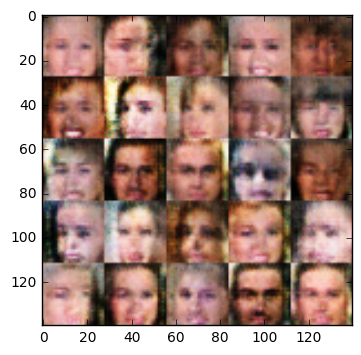

Epoch 1/1... Discriminator Loss: 1.3495... Generator Loss: 0.8528
Epoch 1/1... Discriminator Loss: 1.3876... Generator Loss: 0.7389
Epoch 1/1... Discriminator Loss: 1.3780... Generator Loss: 0.8362
Epoch 1/1... Discriminator Loss: 1.3897... Generator Loss: 0.6798
Epoch 1/1... Discriminator Loss: 1.4132... Generator Loss: 0.6229
Epoch 1/1... Discriminator Loss: 1.3788... Generator Loss: 0.7263
Epoch 1/1... Discriminator Loss: 1.3916... Generator Loss: 0.7041
Epoch 1/1... Discriminator Loss: 1.3919... Generator Loss: 0.6076
Epoch 1/1... Discriminator Loss: 1.3979... Generator Loss: 0.6640
Epoch 1/1... Discriminator Loss: 1.3863... Generator Loss: 0.7290


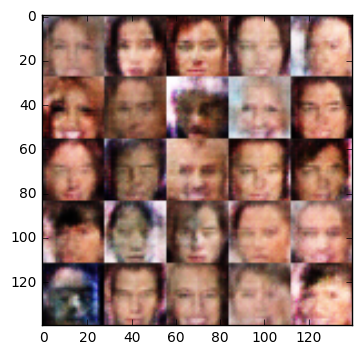

Epoch 1/1... Discriminator Loss: 1.4014... Generator Loss: 0.6778
Epoch 1/1... Discriminator Loss: 1.4439... Generator Loss: 0.8143
Epoch 1/1... Discriminator Loss: 1.3548... Generator Loss: 0.8237
Epoch 1/1... Discriminator Loss: 1.4044... Generator Loss: 0.6525
Epoch 1/1... Discriminator Loss: 1.3767... Generator Loss: 0.7805
Epoch 1/1... Discriminator Loss: 1.3880... Generator Loss: 0.7072
Epoch 1/1... Discriminator Loss: 1.3989... Generator Loss: 0.7358
Epoch 1/1... Discriminator Loss: 1.4084... Generator Loss: 0.6596
Epoch 1/1... Discriminator Loss: 1.3874... Generator Loss: 0.7827
Epoch 1/1... Discriminator Loss: 1.3822... Generator Loss: 0.7939


KeyboardInterrupt: 

In [13]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.3
alpha = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.